Function to calcuculate SFC

In [1]:
import numpy as np
import zCurve as z

def calculateMortonFromTwoLatLonFloats_with_zCurve(x, y):
    # Cap floating point numbers to six decimal places
    x_int = int( round( (x + 90.0), 6 ) * 100000 )
    y_int = int( round( (y + 180.0), 6 ) * 100000 )
    value = z.interlace(x_int, y_int, dims=2)
    return value
    
def mortonEncode2D(a, b):
    x = np.uint64(a)
    y = np.uint64(b)

    x = (x | (x << np.uint64(16))) & np.uint64(0x0000FFFF0000FFFF)
    x = (x | (x << np.uint64(8)))  & np.uint64(0x00FF00FF00FF00FF)
    x = (x | (x << np.uint64(4)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    x = (x | (x << np.uint64(2)))  & np.uint64(0x3333333333333333)
    x = (x | (x << np.uint64(1)))  & np.uint64(0x5555555555555555)

    y = (y | (y << np.uint64(16))) & np.uint64(0x0000FFFF0000FFFF)
    y = (y | (y << np.uint64(8)))  & np.uint64(0x00FF00FF00FF00FF)
    y = (y | (y << np.uint64(4)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    y = (y | (y << np.uint64(2)))  & np.uint64(0x3333333333333333)
    y = (y | (y << np.uint64(1)))  & np.uint64(0x5555555555555555)

    result = np.uint64( x | (y << np.uint64(1)) )
    return result

def mortonExtractEvenBits(a):
    x = np.uint64(a)
    
    x = x & np.uint64(0x5555555555555555)
    x = (x | (x >> np.uint64(1)))  & np.uint64(0x3333333333333333)
    x = (x | (x >> np.uint64(2)))  & np.uint64(0x0F0F0F0F0F0F0F0F)
    x = (x | (x >> np.uint64(4)))  & np.uint64(0x00FF00FF00FF00FF)
    x = (x | (x >> np.uint64(8)))  & np.uint64(0x0000FFFF0000FFFF)
    x = (x | (x >> np.uint64(16))) & np.uint64(0x00000000FFFFFFFF)
    
    return x.astype(np.uint32)

def mortonDecode2D(a):
    _a = np.uint64(a)
    
    x = mortonExtractEvenBits(_a)
    y = mortonExtractEvenBits(_a >> np.uint64(1))
    
    return (x, y)

def calculateMortonFromTwoLatLonFloats(x, y):
    _x = np.float32(x)
    _y = np.float32(y)
    # Cap floating point numbers to six decimal places.
    x_int = np.uint32( np.round( (_x + np.float32(90.0) ), 6 ) * np.uint32(100000) )
    y_int = np.uint32( np.round( (_y + np.float32(180.0) ), 6 ) * np.uint32(100000) )
    value = mortonEncode2D(x_int, y_int)
    return value

def calculateTwoLatLonFloatsFromMorton(a):
    pair = mortonDecode2D(a)
    _x = np.float32(pair[0] / np.float32(100000.0) - np.float32(90.0))
    _y = np.float32(pair[1] / np.float32(100000.0) - np.float32(180.0))
    return (_x, _y)


def calculateMortonFromXYAccelerationFloats(x, y):
    _x = np.float32(x)
    _y = np.float32(y)
    # Cap floating point numbers to six decimal places.
    x_int = np.uint32( np.round( (_x + np.float32(10.0) ), 6 ) * np.uint32(100) )
    y_int = np.uint32( np.round( (_y + np.float32(10.0) ), 6 ) * np.uint32(100) )
    value = mortonEncode2D(x_int, y_int)
    return value

def calculateXYAccelerationFloatsFromMorton(a):
    pair = mortonDecode2D(a)
    _x = np.float32(pair[0] / np.float32(100.0) - np.float32(10.0))
    _y = np.float32(pair[1] / np.float32(100.0) - np.float32(10.0))
    return (_x, _y)

### Chunk 2

**b0c9d2329ad1606b|2018-11-11--13-08-44**

set 17

Here we improved the modelling theory by changing the dimension and plcement of the box.

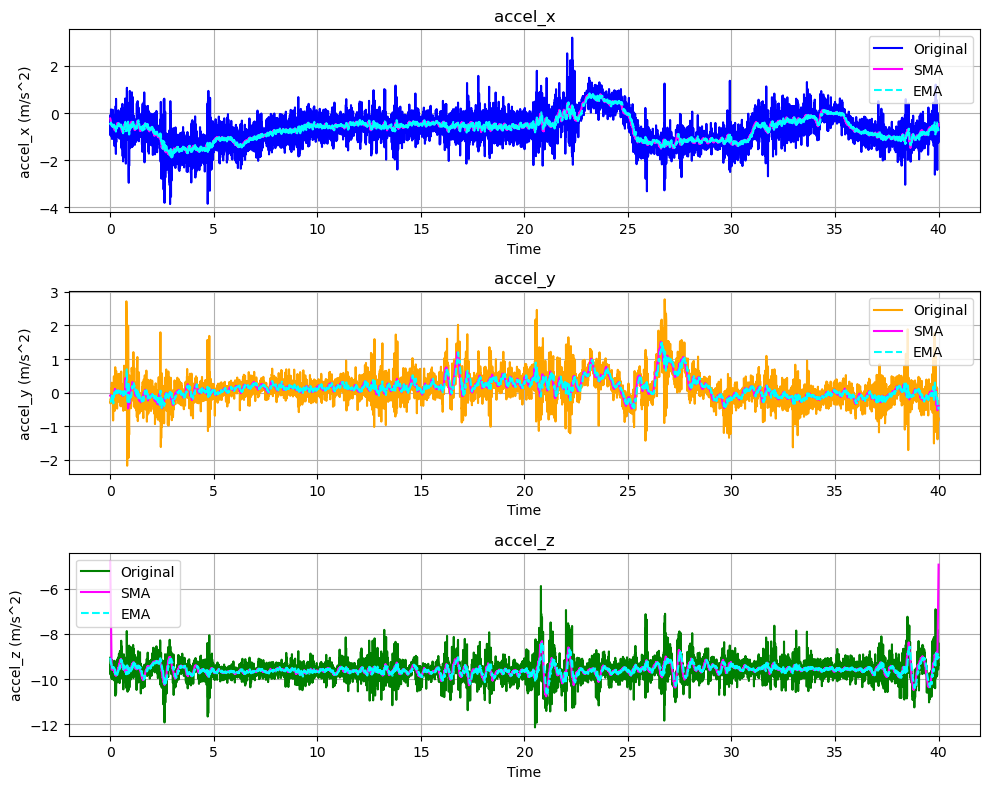

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value17_2018-11-11--13-08-44')
data_t = np.load('t17_2018-11-11--13-08-44')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(10, 8))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [3]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set17 = []
set17_A = []
set17_B = []
time17 = []
group_A = []
group_B = []
counter = 0
group_RA = []
group_RB = []
x = 0


for data_point, time in combined_data :
    if time > 22.5 and time < 29.5:
        if data_point < -0.3  or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set17_A.append(morton)
            time_norm = time -22.5
            set17.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_RA.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set17_B.append(morton)
            time_norm = time -22.5
            set17.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_RB.append(morton)

    
df_set17 = pd.DataFrame(set17, columns=['morton','timestamp'])
print(df_set17)




       morton  timestamp
0     2446954   0.000659
1     1047754   0.007048
2     1047778   0.013438
3     1047626   0.019848
4     2446442   0.026237
...       ...        ...
1090  1048290   6.972371
1091  1046240   6.978761
1092  1048130   6.985150
1093  2446570   6.991560
1094  1046208   6.997949

[1095 rows x 2 columns]


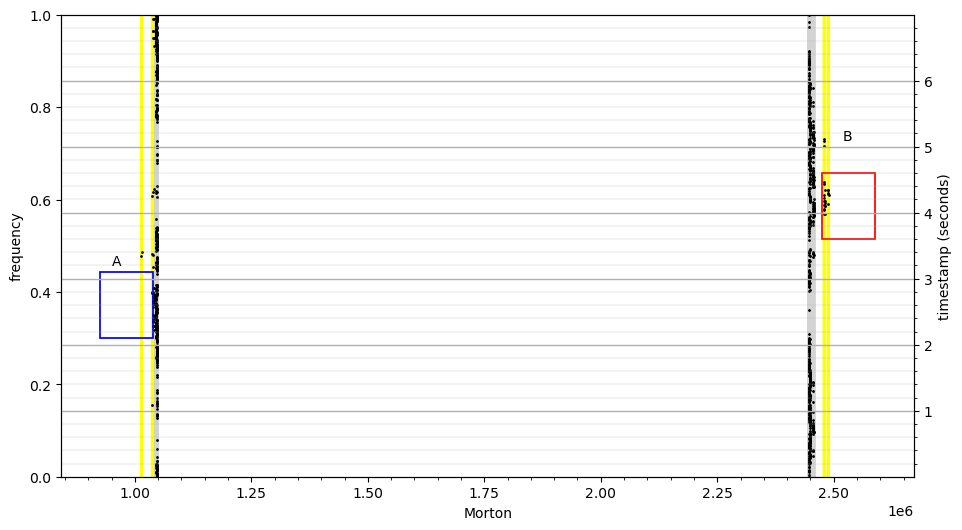

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as patches

data1 = [set17_A, set17_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set17['morton']
timestamp_seconds = df_set17['timestamp']



plt.figure(figsize=(11, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))
#plt.xticks(np.arange(min(morton17), max(morton17), 0.5e6))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors= data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1.03e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=1)  # Adjust size of dots


# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9255*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.6), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Evaluate: Here there is a lane change happening 22 and 30, we ploted the strip plot and applied the box from the snowfox data. It looks like it could only detect the upper peak of the lane change and not the lower peak. The threshold might need to be changed


Improve: We adjusted the threshold a bit, but since there is a lot of noise its kinda hard to differentiate and draw the boxes properly. The duration is 2.5 

**b0c9d2329ad1606b|2018-11-11--13-08-44**

set 21

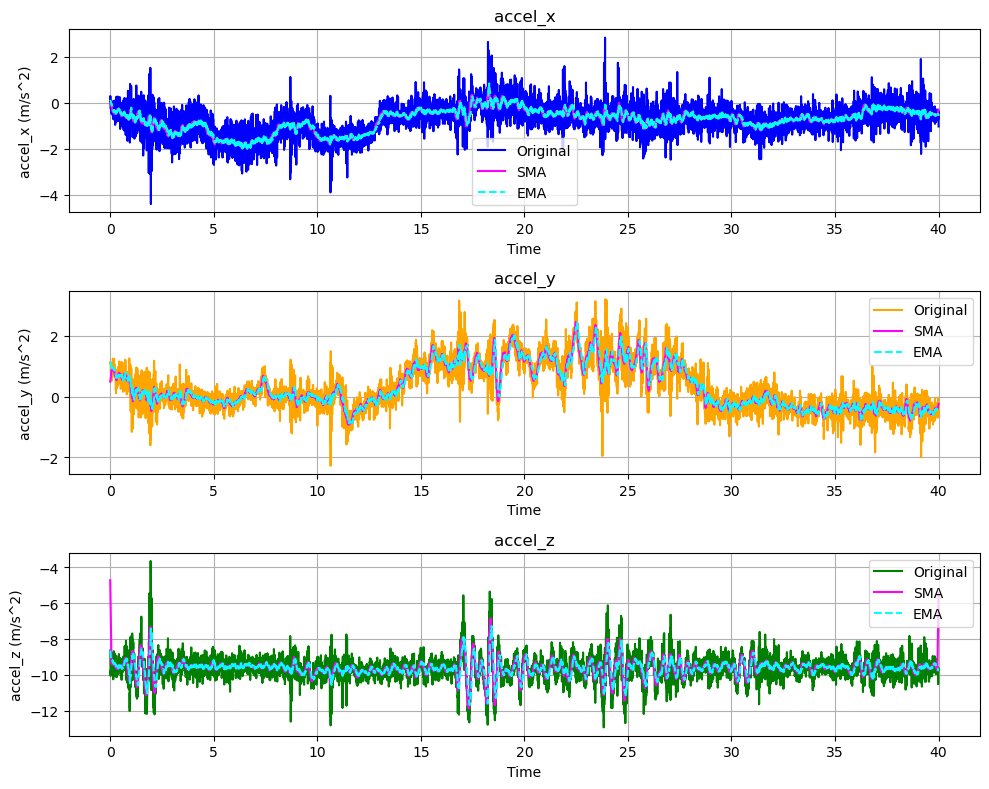

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value21_2018-11-11--13-08-44')
data_t = np.load('t21_2018-11-11--13-08-44')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(10, 8))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [6]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set21_A = []
set21_B = []
set21 = []
group_4A = []
group_4B = []

for data_point, time in combined_data :
    if time > 10 and time < 16:
        if data_point < -1 or data_point > 0.8:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set21_A.append(morton)
            time_norm = time -10
            set21.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_4A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set21_B.append(morton)
            time_norm = time -10
            set21.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_4B.append(morton)

    
df_set21 = pd.DataFrame(set21, columns=['morton','timestamp'])
print(df_set21)




      morton  timestamp
0    1037504   0.003355
1    1047656   0.009745
2    1047624   0.016134
3    1046208   0.022544
4    1048136   0.028934
..       ...        ...
933  2457320   5.970844
934  2456768   5.977254
935  2455112   5.983644
936  2456778   5.990033
937  2456680   5.996443

[938 rows x 2 columns]


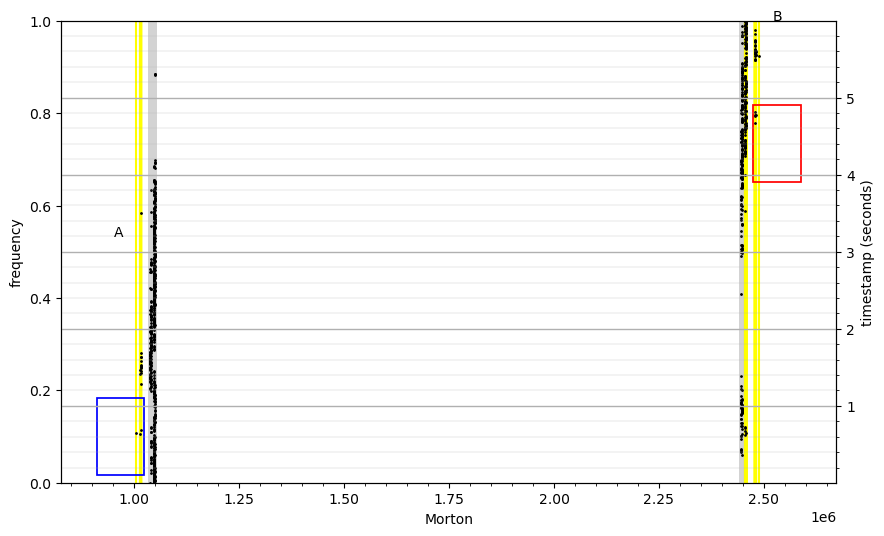

In [7]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set21_A, set21_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set21['morton']
timestamp_seconds = df_set21['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=1)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 0.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 6, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.9), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Evaluate: There is a lane change happening in 10-17 then there is a right road curve. However our model is not able to capture the lane change, since the lane change is happenning for a longer period of time

Improve: We changed the duration of the lane change from 2.9 sec to 3.8 sec, there should be a range of duration.

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/6

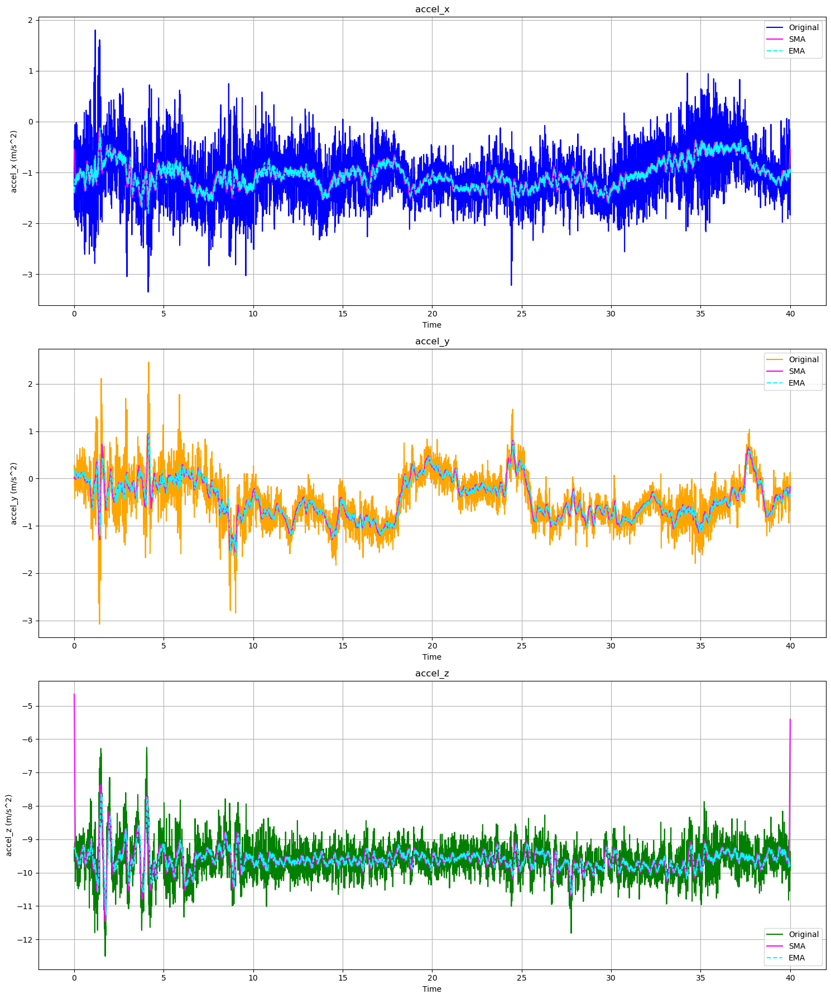

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value6_2018-10-05--21-20-29')
data_t = np.load('t6_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

This file doesn't have a lane change

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/13

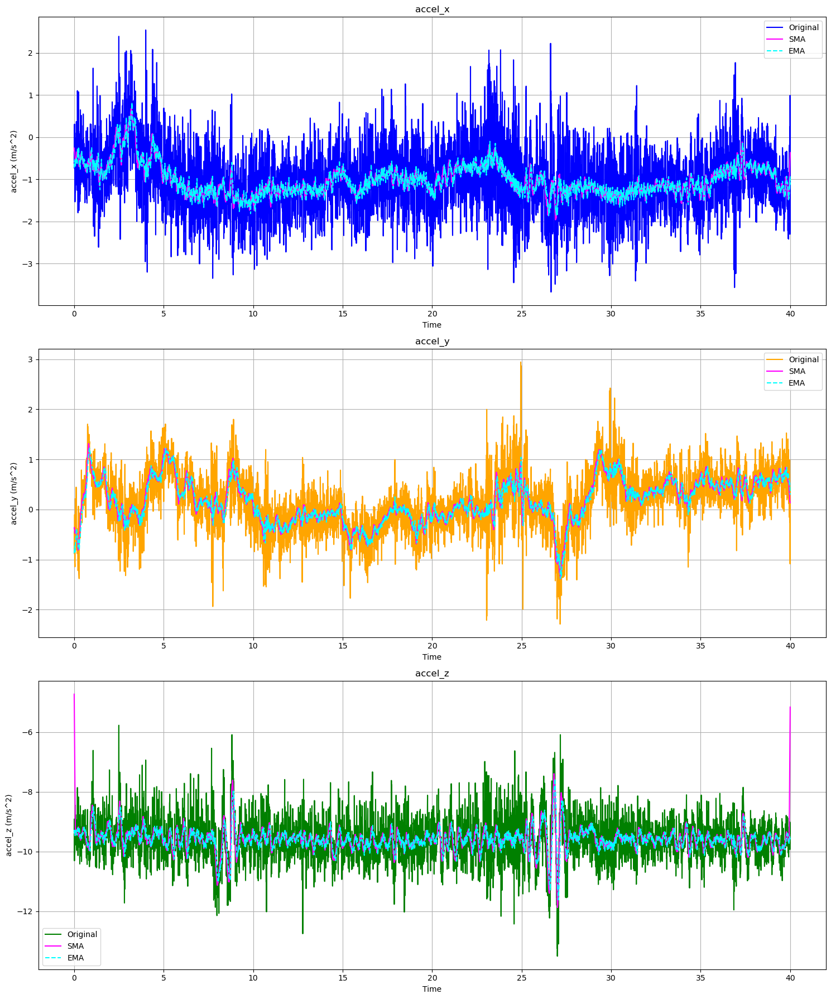

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value13_2018-10-05--21-20-29')
data_t = np.load('t13_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [10]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set13_A = []
set13_B = []
set13 = []

for data_point, time in combined_data :
    if time > 24.5 and time < 31.5:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_A.append(morton)
            time_norm = time -24.5
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_B.append(morton)
            time_norm = time -24.5
            set13.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set13 = pd.DataFrame(set13, columns=['morton','timestamp'])
print(df_set13)




       morton  timestamp
0     2446560   0.005168
1     2454632   0.011577
2     1048264   0.017967
3     1048160   0.024356
4     2446528   0.030745
...       ...        ...
1089  1047656   6.969278
1090  2446912   6.975667
1091  2447042   6.982056
1092  2446560   6.988445
1093  1046240   6.994855

[1094 rows x 2 columns]


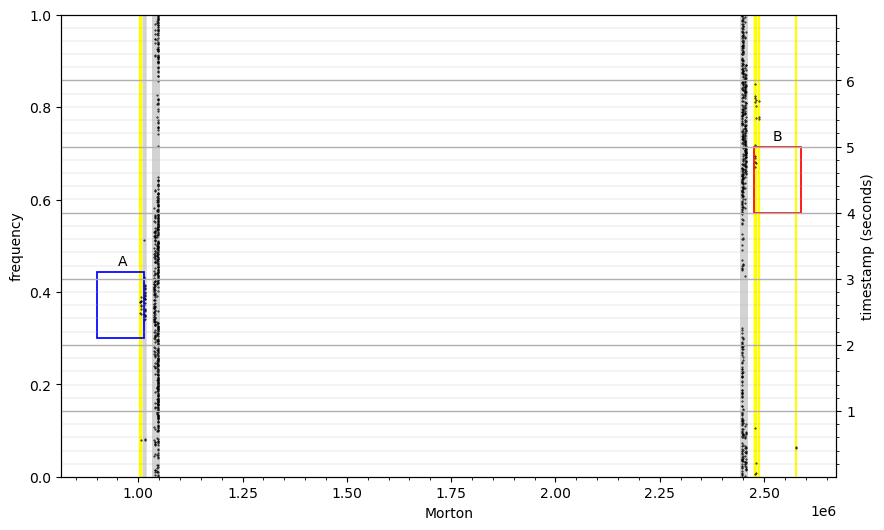

In [11]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set13_A, set13_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set13['morton']
timestamp_seconds = df_set13['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here there is two lane change happpening kind of one after the other, however in the graph they are mashed as one lane change happenning between 24.5 - 33. And our model seems to capture it, however it is  right lane change that means its wrong, probably false positive. 
There is a right lane change happenning from 9-11.
Look more into the right lane change happenning at 25.

Chunk_2/b0c9d2329ad1606b|2018-10-05--21-20-29/8

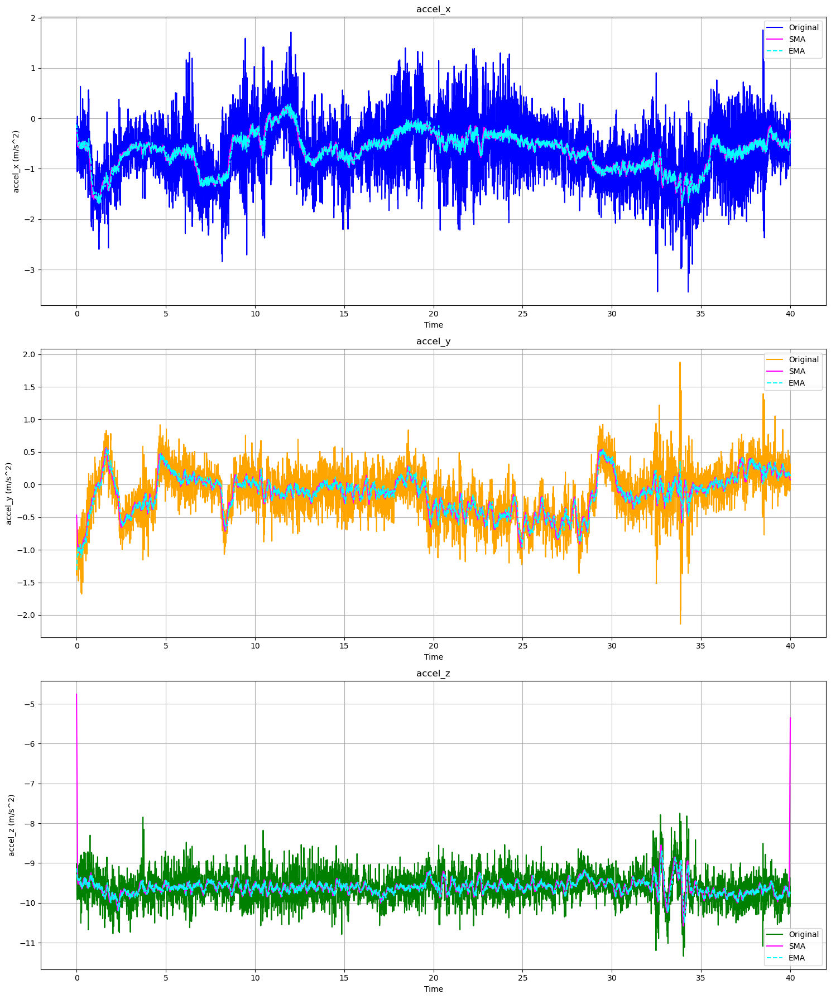

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value8_2018-10-05--21-20-29')
data_t = np.load('t8_2018-10-05--21-20-29')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [13]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set8_A = []
set8_B = []
set8 = []

for data_point, time in combined_data :
    if time > 3 and time < 10:
        if data_point < -1 or data_point > 1:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_A.append(morton)
            time_norm = time -3
            set8.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_B.append(morton)
            time_norm = time -3
            set8.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set8 = pd.DataFrame(set8, columns=['morton','timestamp'])
print(df_set8)




       morton  timestamp
0     1045576   0.005524
1     1045570   0.011914
2     1039562   0.018344
3     1039426   0.024733
4     1040074   0.031122
...       ...        ...
1089  1047746   6.969619
1090  1047752   6.976009
1091  1046240   6.982398
1092  1048138   6.988787
1093  1047626   6.995197

[1094 rows x 2 columns]


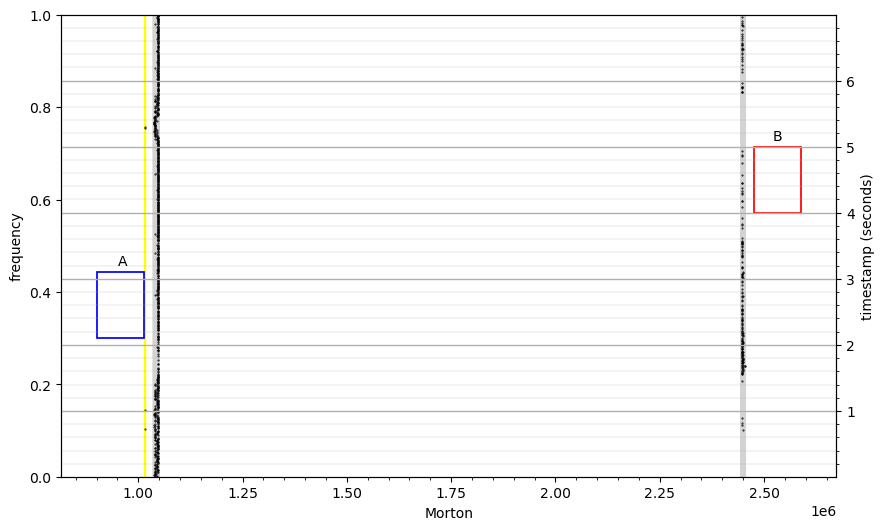

In [14]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set8_A, set8_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set8['morton']
timestamp_seconds = df_set8['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


The lane change is too low meanning the peaks doesnt excede 1m/s which means our model doesn't capture it. Also the lane change happens in one second however our model capture s the ones happens in 3 seconds 

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-46-40/9

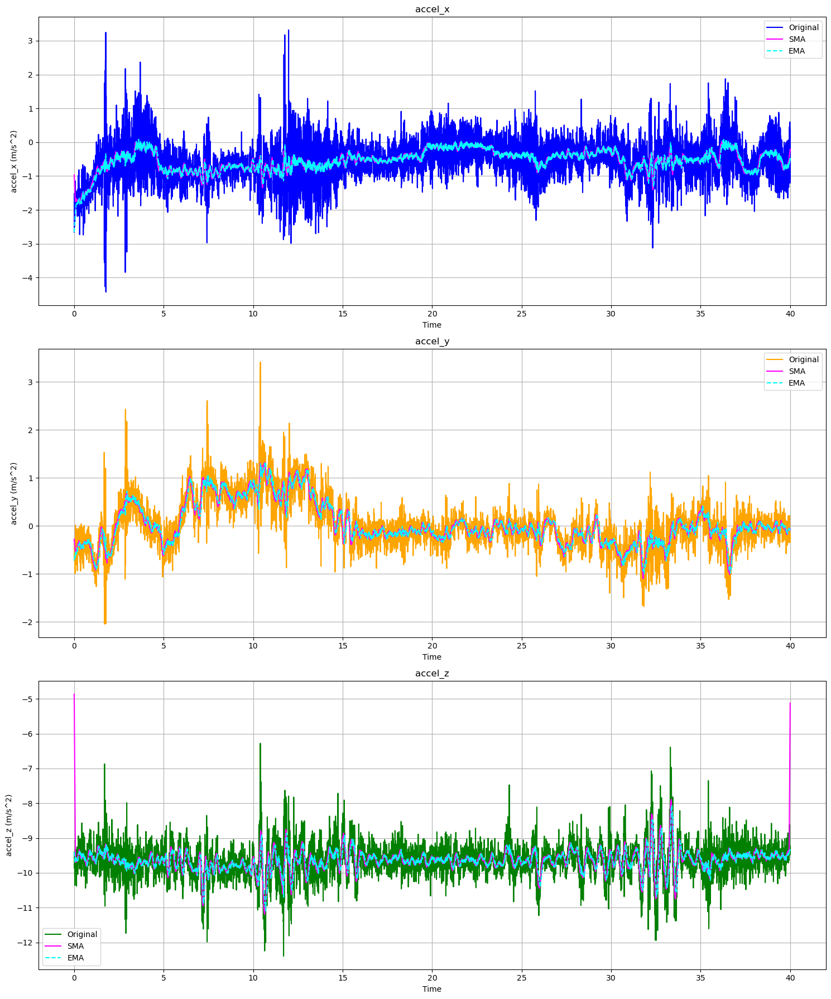

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value9_2018-10-05--20-46-40')
data_t = np.load('t9_2018-10-05--20-46-40')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [16]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set9_A = []
set9_B = []
set9 = []

for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set9_A.append(morton)
            time_norm = time 
            set9.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set9_B.append(morton)
            time_norm = time
            set9.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set9 = pd.DataFrame(set9, columns=['morton','timestamp'])
print(df_set9)




       morton  timestamp
0     1039936   0.006389
1     1039970   0.012799
2     1045568   0.019188
3     1045602   0.025578
4     1039970   0.031987
...       ...        ...
1089  2446922   6.970592
1090  1048290   6.976981
1091  1047778   6.983391
1092  1048130   6.989780
1093  1048160   6.996169

[1094 rows x 2 columns]


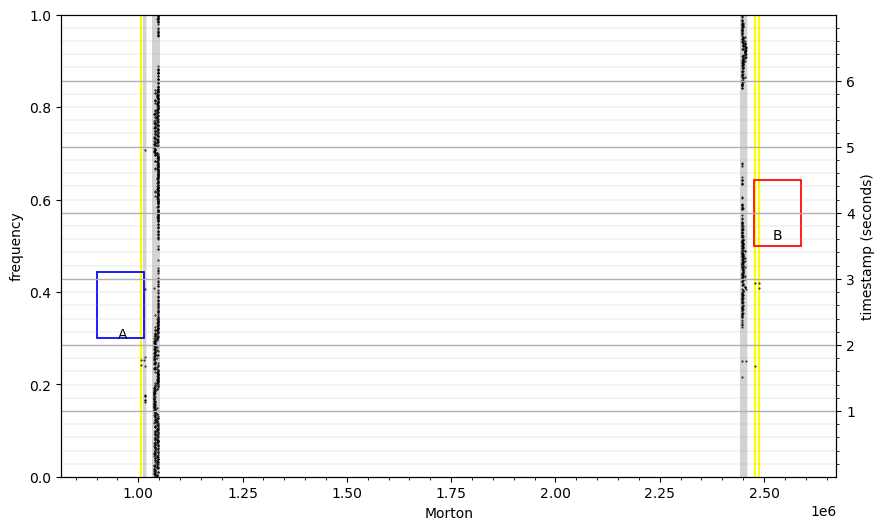

In [17]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set9_A, set9_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set9['morton']
timestamp_seconds = df_set9['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 2.1, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 3.6, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.5), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


As we can see the model was abel to capture one of the peaks since the duration of the lane change is relatively less than the model. Therefore the lane changes tends to very from 1 to 5 seconds

Improve: We changed the duration of the lane change from 2.9 sec to 2.4 sec

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-16-56/10

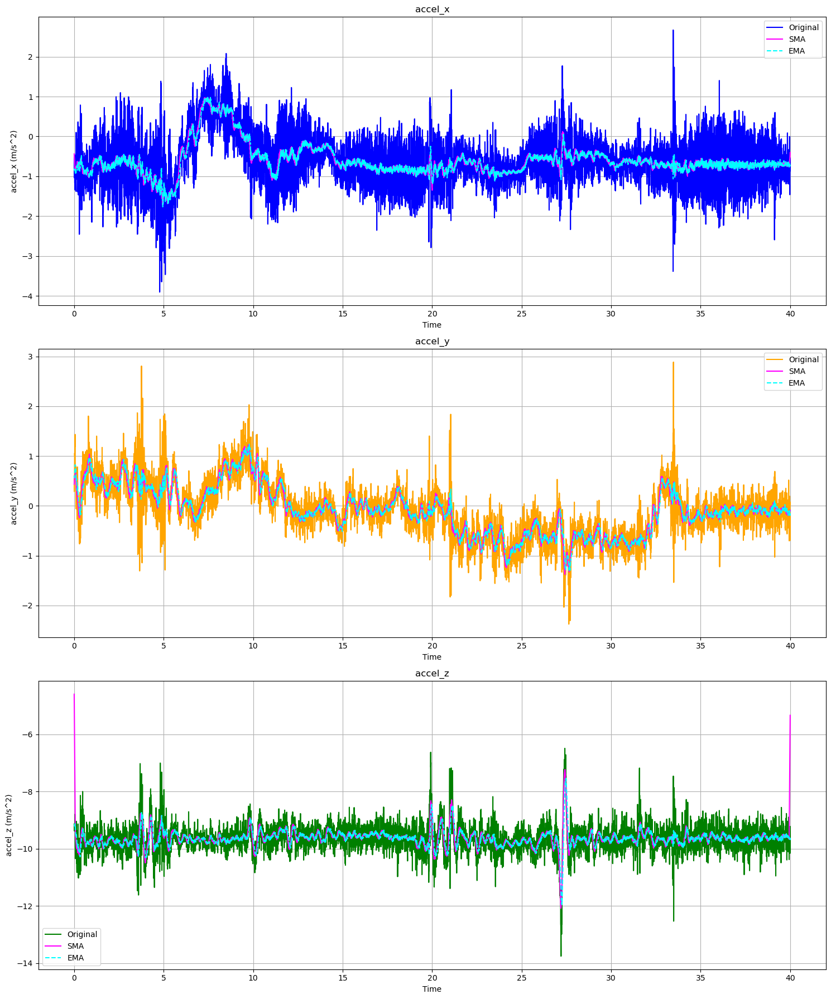

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value10_2018-10-05--20-16-56')
data_t = np.load('t10_2018-10-05--20-16-56')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [19]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set10_A = []
set10_B = []
set10 = []

for data_point, time in combined_data :
    if time > 5 and time < 12:
        if data_point < -0.3 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set10_A.append(morton)
            time_norm = time - 5
            set10.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_RA.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set10_B.append(morton)
            time_norm = time - 5
            set10.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_RB.append(morton)

    
df_set10 = pd.DataFrame(set10, columns=['morton','timestamp'])
print(df_set10)




       morton  timestamp
0     2446440   0.000008
1     2448960   0.006417
2     1048296   0.012806
3     2448618   0.019195
4     1048288   0.025584
...       ...        ...
1090  2446440   6.969315
1091  2446912   6.975704
1092  2446560   6.982093
1093  1048168   6.988481
1094  1048298   6.994891

[1095 rows x 2 columns]


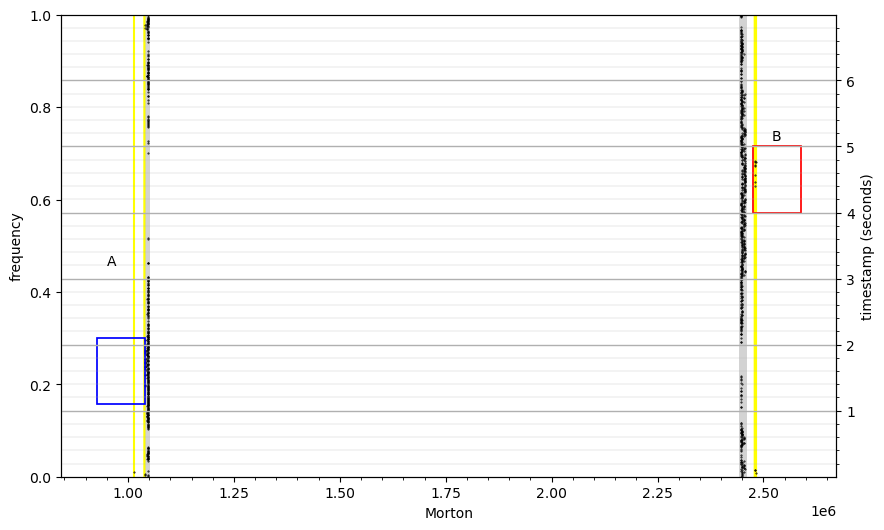

In [20]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set10_A, set10_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set10['morton']
timestamp_seconds = df_set10['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.926*1e6, 1.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here our model was able to capture on of the peaks again, because the box A doesn't fall under the threshold we defined. The road is curving to the right therefore the pattern is kinda up, maybe need adjust the whole thing. Maybe add another variable to adjust when the road is curving to the right or left. I.e. decrease or increase the acceleration by 0.5

Improve: the threshold was adjusted to -0.5 and duration to 3.9 sec.The threshold was adjusted beacause of curvy right road to the.

Chunk_2/b0c9d2329ad1606b|2018-10-05--20-16-56/13

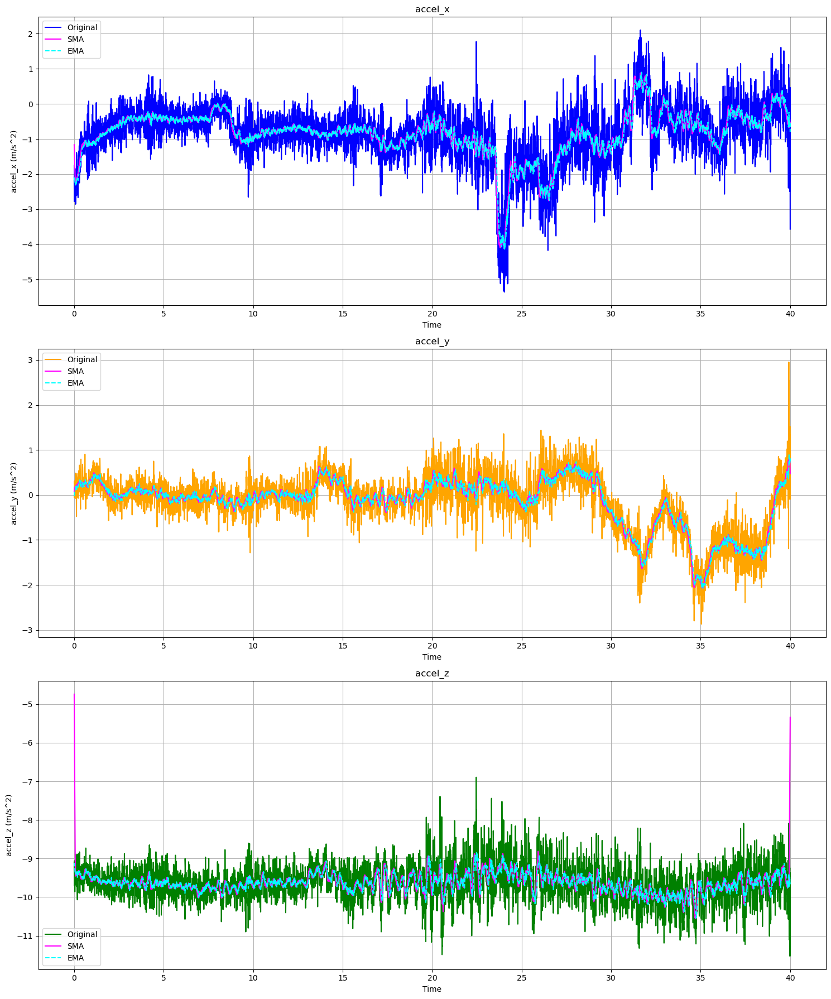

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value13_2018-10-05--20-16-56')
data_t = np.load('t13_2018-10-05--20-16-56')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [22]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set13_A1 = []
set13_B1 = []
set13_1 = []
group_LA = []
group_LB = []

for data_point, time in combined_data :
    if time > 29 and time < 36:
        if (data_point  < -1.5 and data_point > -2) or (data_point > 0.2) :
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_A1.append(morton)
            time_norm = time - 29
            set13_1.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_LA.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set13_B1.append(morton)
            time_norm = time - 29
            set13_1.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_LB.append(morton)


    
df_set13_1 = pd.DataFrame(set13_1, columns=['morton','timestamp'])
print(df_set13_1)




       morton  timestamp
0     2446562   0.000262
1     2448490   0.006672
2     2454720   0.013082
3     1048128   0.019471
4     1048256   0.025861
...       ...        ...
1090  1012930   6.971017
1091  1007306   6.977407
1092  1013440   6.983817
1093  1013314   6.990207
1094  1013440   6.996596

[1095 rows x 2 columns]


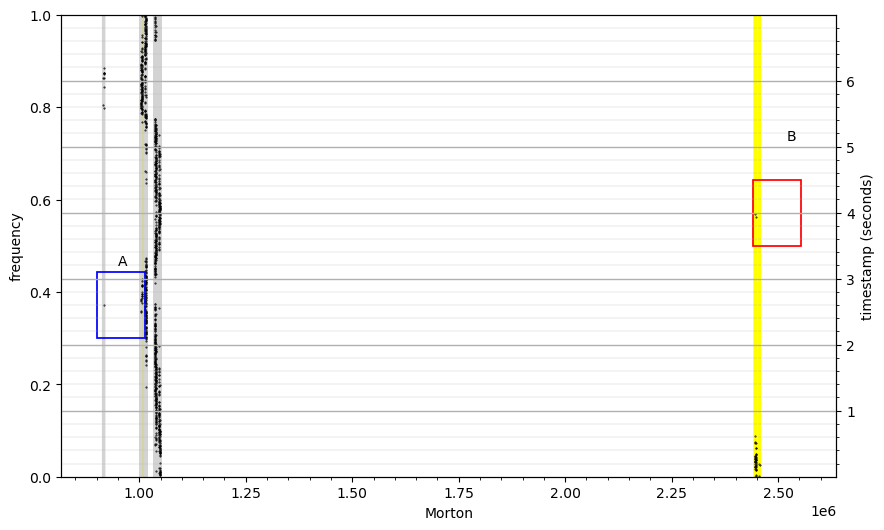

In [23]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set13_A1, set13_B1]
data_colors = ['yellow', 'lightgray']

morton17 = df_set13_1['morton']
timestamp_seconds = df_set13_1['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.44*1e6, 3.5), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


We can see a lane change happening betweern 30-35 seconds but due to a curvy road to the left the pattern seems to  be happening a bit downwards than the original margin. Maybe our model needs to accomodate for curvy roads, saying that if curvy road to left, adjust acceleration i.e morton value.

Improve: We adjusted the threshold by 0.8 m/s and duration to 2.4 sec 

Chunk_2/b0c9d2329ad1606b|2018-09-24--12-49-08/28

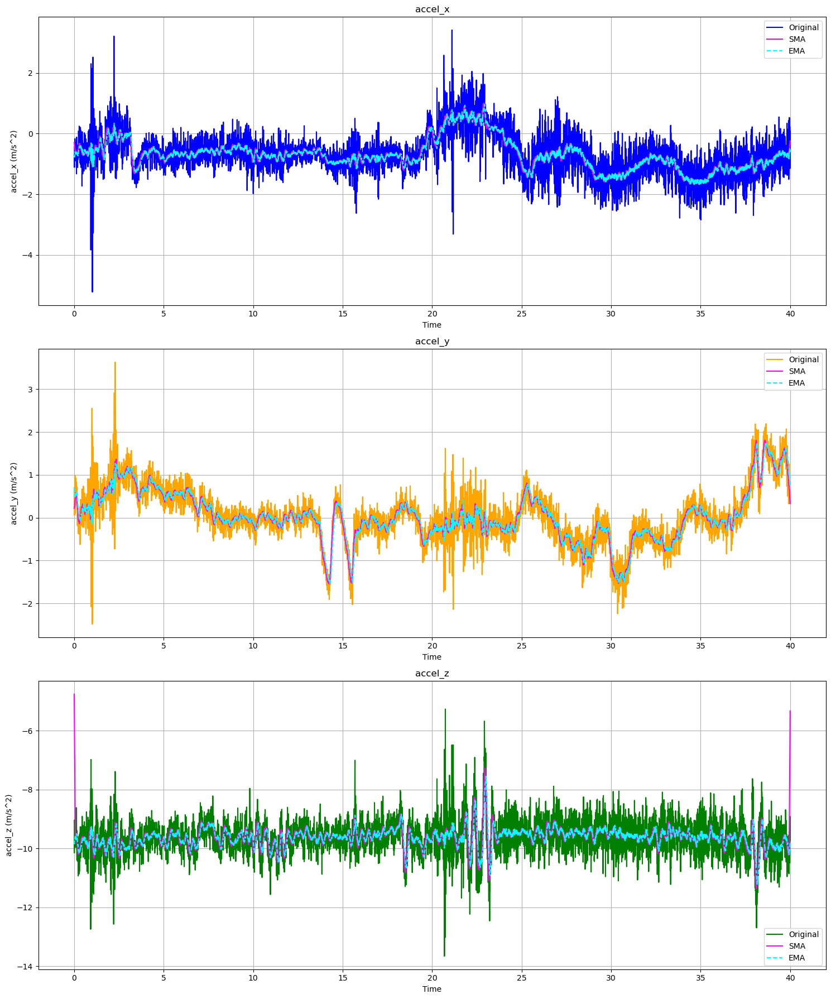

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value28_2018-09-24--12-49-08')
data_t = np.load('t28_2018-09-24--12-49-08')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [25]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set28_A = []
set28_B = []
set28 = []

for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set28_A.append(morton)
            time_norm = time 
            set28.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set28_B.append(morton)
            time_norm = time 
            set28.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set28 = pd.DataFrame(set28, columns=['morton','timestamp'])
print(df_set28)




       morton  timestamp
0     2446410   0.006389
1     1048162   0.012779
2     1047778   0.019189
3     1048128   0.025578
4     1048266   0.031968
...       ...        ...
1089  2446400   6.971389
1090  1048130   6.977779
1091  1048160   6.984168
1092  1047618   6.990558
1093  1048290   6.996967

[1094 rows x 2 columns]


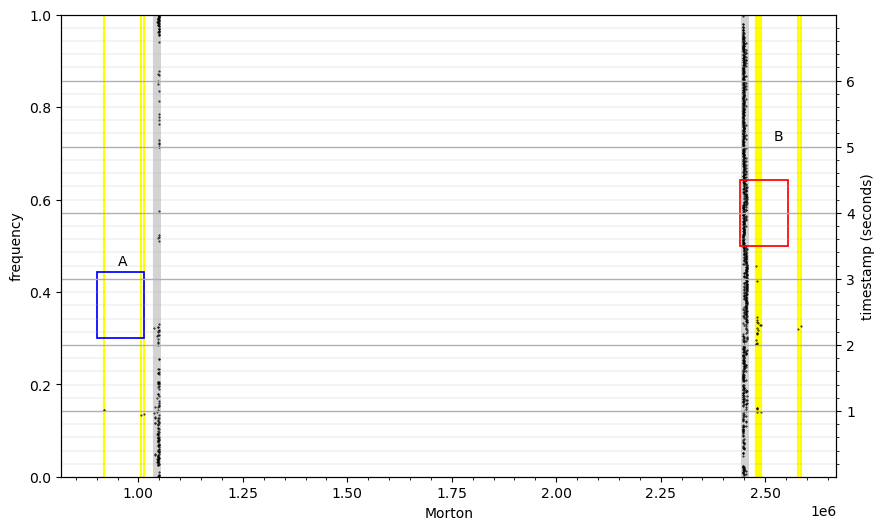

In [26]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set28_A, set28_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set28['morton']
timestamp_seconds = df_set28['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.44*1e6, 3.5), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Was not able to see a proper lane change from 20-25 seconds, since we saw in the video

Chunk_2/b0c9d2329ad1606b|2018-09-23--12-52-06/42

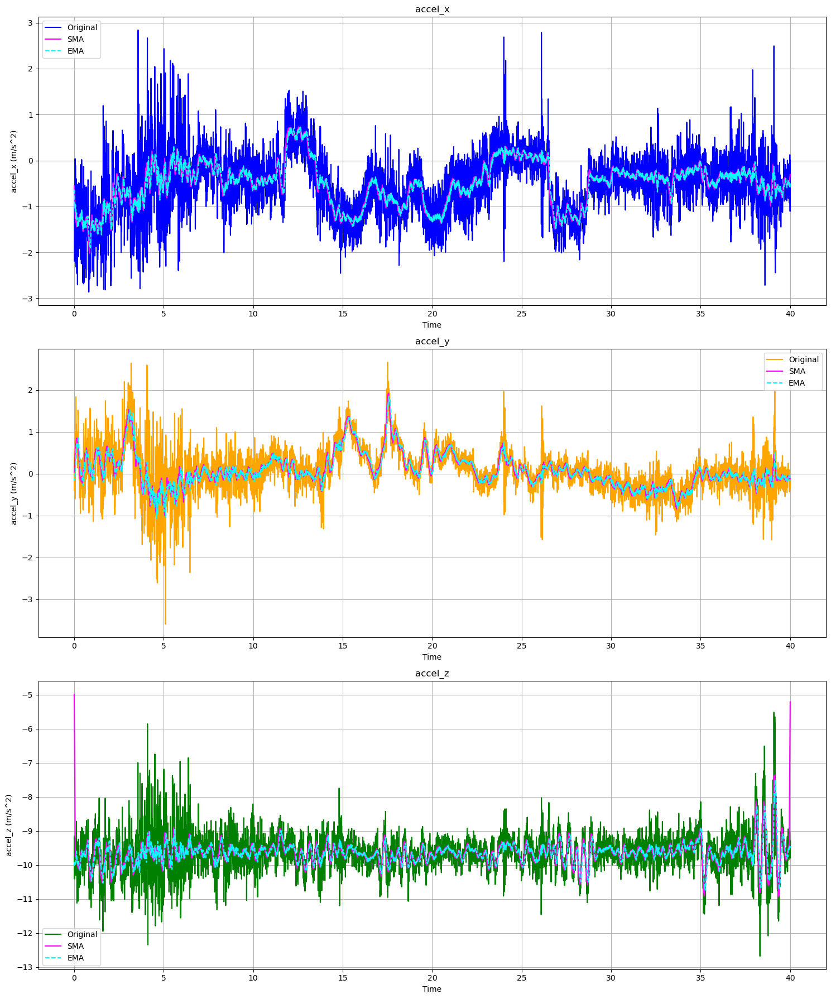

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value42_2018-09-23--12-52-06')
data_t = np.load('t42_2018-09-23--12-52-06')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [28]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set42_A = []
set42_B = []
set42 = []
group_2A = []
group_2B = []

for data_point, time in combined_data :
    if time > 11 and time < 18:
        if data_point < -1 or data_point > 1:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set42_A.append(morton)
            time_norm = time - 11
            set42.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_2A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set42_B.append(morton)
            time_norm = time - 11
            set42.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_2B.append(morton)
 

    
df_set42 = pd.DataFrame(set42, columns=['morton','timestamp'])
print(df_set42)




       morton  timestamp
0     2448586   0.000952
1     2446944   0.007341
2     2454602   0.013731
3     2449128   0.020120
4     2448450   0.026530
...       ...        ...
1090  2455266   6.972363
1091  2454760   6.978773
1092  2455136   6.985162
1093  2454624   6.991552
1094  2454760   6.997941

[1095 rows x 2 columns]


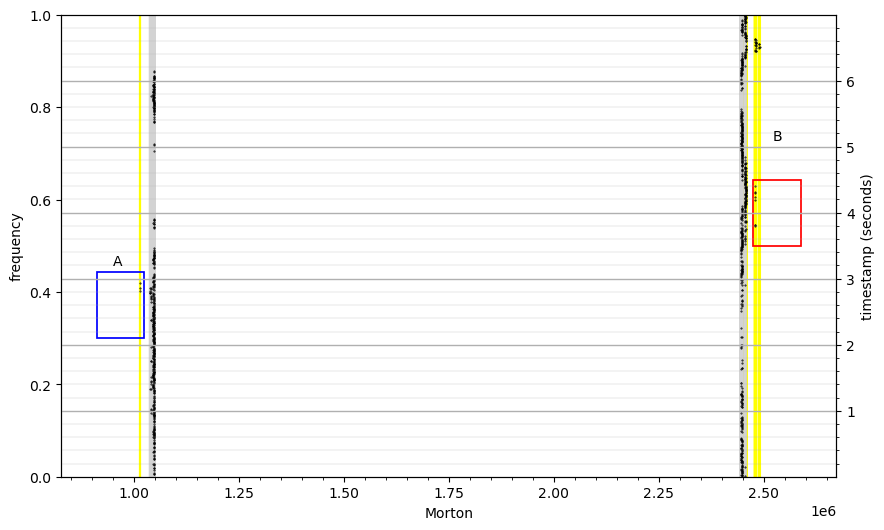

In [29]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set42_A, set42_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set42['morton']
timestamp_seconds = df_set42['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.911*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.5), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here there is two lanw change happening from 13- 17 and another one from 22-26, but only the first one is recognizable therefore we applied our model on the first one. As we can see only box B was captured not A. A wasn't captured due to threshold and duration both in this case.

Improve: here we adjusted the lower threshold to be -1 instead of -1.5 and changed the duration to 2.4 sec instead of 2.9 

Chunk_2/b0c9d2329ad1606b|2018-09-23--12-52-06/47

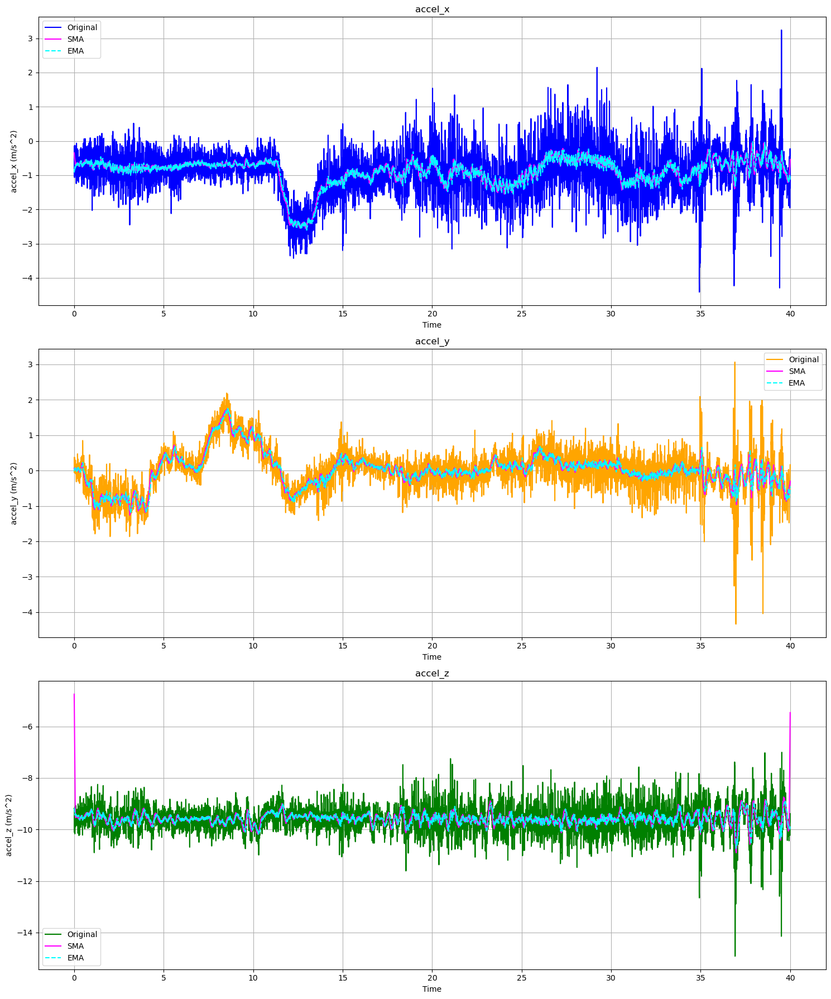

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value47_2018-09-23--12-52-06')
data_t = np.load('t47_2018-09-23--12-52-06')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [31]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set47_A = []
set47_B = []
set47 = []

for data_point, time in combined_data :
    if time > 10.5 and time < 17.5:
        if data_point < -1 or data_point > 0.8:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set47_A.append(morton)
            time_norm = time - 10.5
            set47.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_4A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set47_B.append(morton)
            time_norm = time - 10.5
            set47.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_4B.append(morton)
            

    
df_set47 = pd.DataFrame(set47, columns=['morton','timestamp'])
print(df_set47)




       morton  timestamp
0     2446912   0.002228
1     1047650   0.008618
2     1048138   0.015008
3     1048170   0.021418
4     2447040   0.027796
...       ...        ...
1090  1046250   6.973696
1091  1048128   6.980106
1092  2446914   6.986516
1093  2447048   6.992906
1094  2446570   6.999295

[1095 rows x 2 columns]


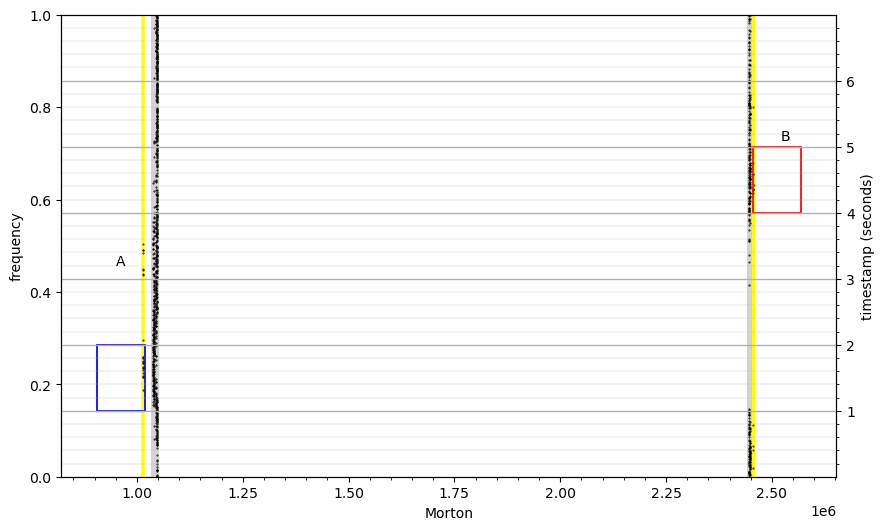

In [32]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set47_A, set47_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set47['morton']
timestamp_seconds = df_set47['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.xlim(2.4e6, 2.5e6) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.905*1e6, 1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.455*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Our model couldn't capture the lane change happening from 10-15 because of threshold again. Having value of 1.2 would have captured the peaks.

Improve: Changed the threshold to be 1 and duration to be 4 sec

Chunk_2/b0c9d2329ad1606b|2018-09-21--23-18-39/2

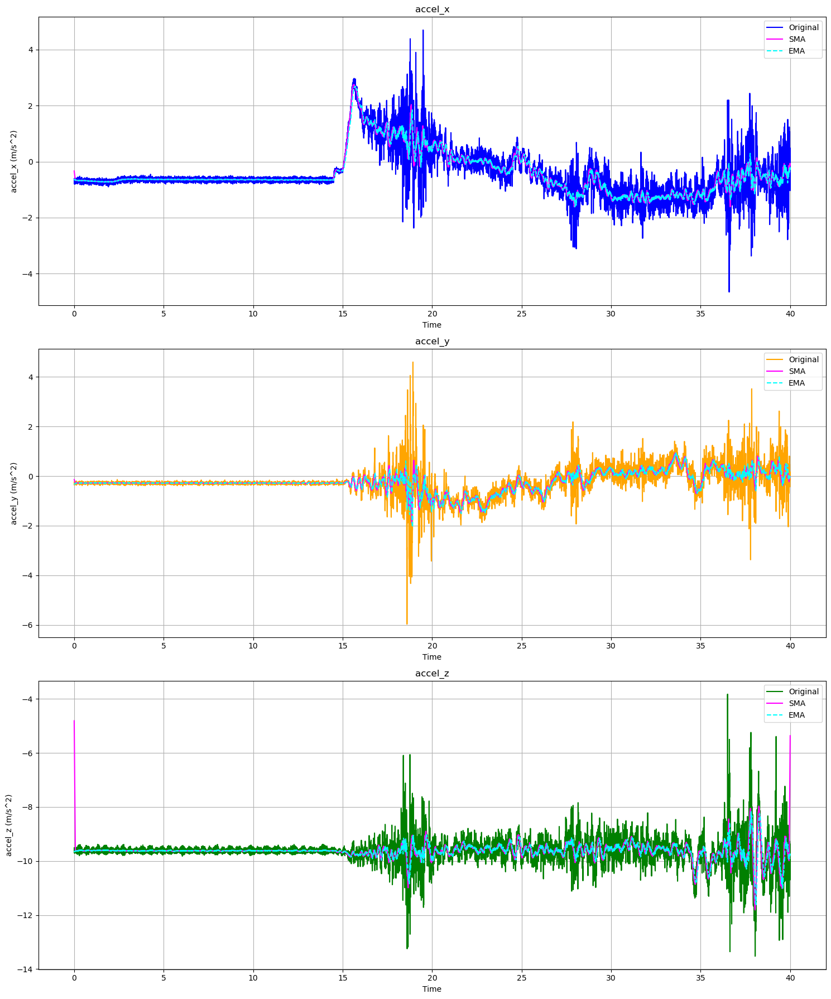

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value2_2018-09-21--23-18-39')
data_t = np.load('t2_2018-09-21--23-18-39')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(15, 18))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [34]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))
x = 0

set2_A = []
set2_B = []
set2 = []

for data_point, time in combined_data :
    if time > 23 and time < 30:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_A.append(morton)
            time_norm = time -23
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_B.append(morton)
            time_norm = time -23 
            set2.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set2 = pd.DataFrame(set2, columns=['morton','timestamp'])
print(df_set2)




       morton  timestamp
0     1012936   0.004949
1     1014850   0.011358
2     1015522   0.017748
3     1015400   0.024137
4     1013472   0.030526
...       ...        ...
1090  2446408   6.974248
1091  2446410   6.980658
1092  2446408   6.987047
1093  2446442   6.993457
1094  1048168   6.999846

[1095 rows x 2 columns]


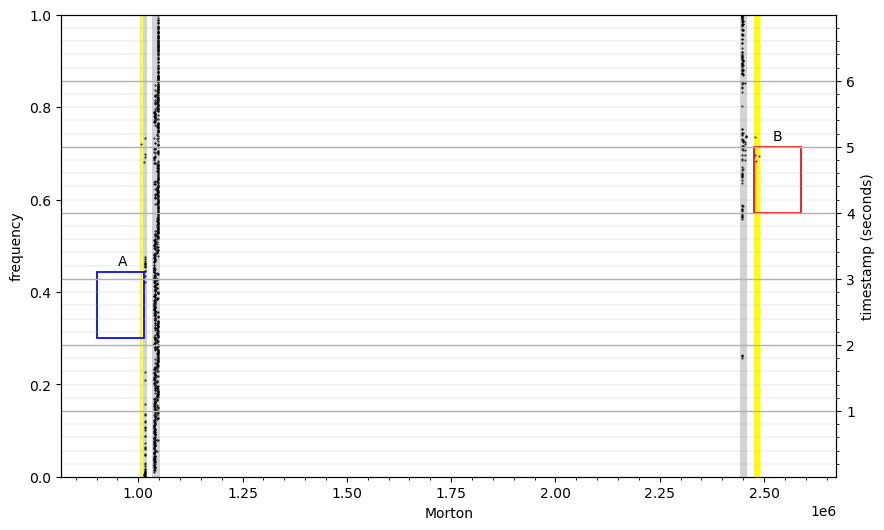

In [35]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set2_A, set2_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set2['morton']
timestamp_seconds = df_set2['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(22, 29.4) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()


Here we can see that our model was once again only able to get box B. Box A could have been captured by adjusting the duration and threshold

Improve: Its hard to understand which one is the lane change from 23-30, we think that is from around 24-25 to 27

***Chunk 1***

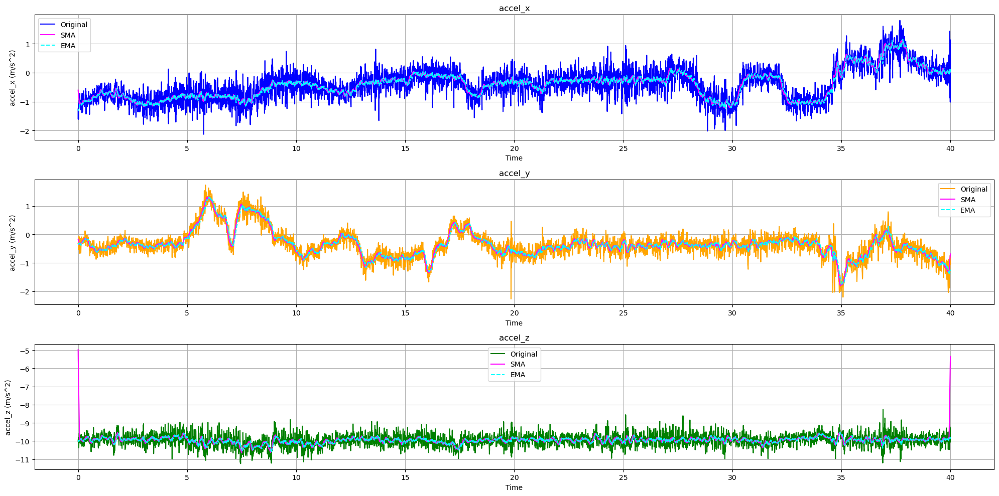

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value7_2018-07-27-06-03-57')
data_t = np.load('t7_2018-07-27-06-03-57')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 10))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    #plt.xlim(33, 40)
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [37]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set7 = []
set7_A = []
set7_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 32.5 and time < 39.5:
        if (data_point < -1.5 and data_point > -2) or (data_point > 0.2):
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set7_A.append(morton)
            time_norm = time -32.5
            set7.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_LA.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set7_B.append(morton)
            time_norm = time -32.5
            set7.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_LB.append(morton)

    
df_set7 = pd.DataFrame(set7, columns=['morton','timestamp'])
print(df_set7)


       morton  timestamp
0     1046242   0.001053
1     1046248   0.007707
2     1046114   0.014361
3     1046112   0.021015
4     1046218   0.027669
...       ...        ...
1152  1013448   6.967695
1153  1013474   6.974349
1154  1014880   6.981003
1155  1015370   6.987657
1156  1037544   6.994311

[1157 rows x 2 columns]


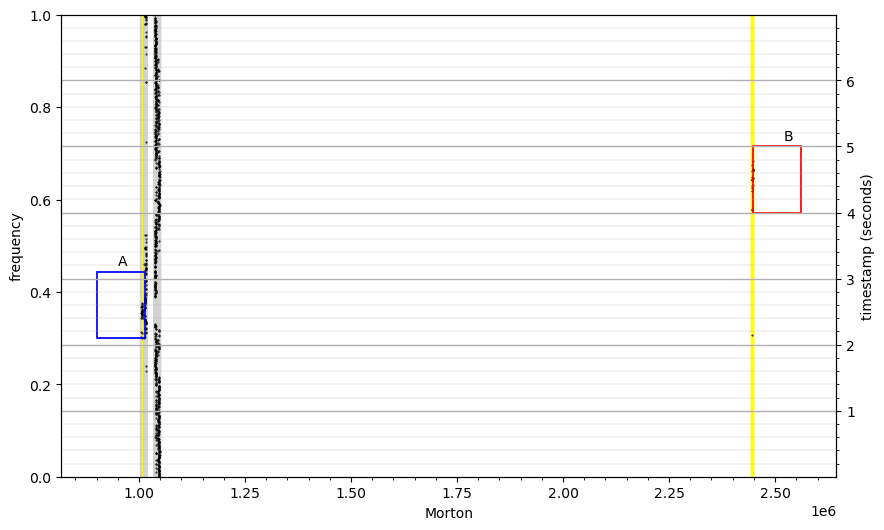

In [38]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set7_A, set7_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set7['morton']
timestamp_seconds = df_set7['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(0.9e6, 1.22e6)
#plt.xlim(2.44e6, 2.46e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots


plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.4475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Improve: we changed the parameter to 0.5 so it encompases the upper peak. We needed to decrease the parameter because it was on a curvy road. We maybe can add another parameter acceleration to keep the accel_y on the same line. Now we have to adjust the parameters from 1.5 to 0.5 in order to capture the peak. 

Value t3

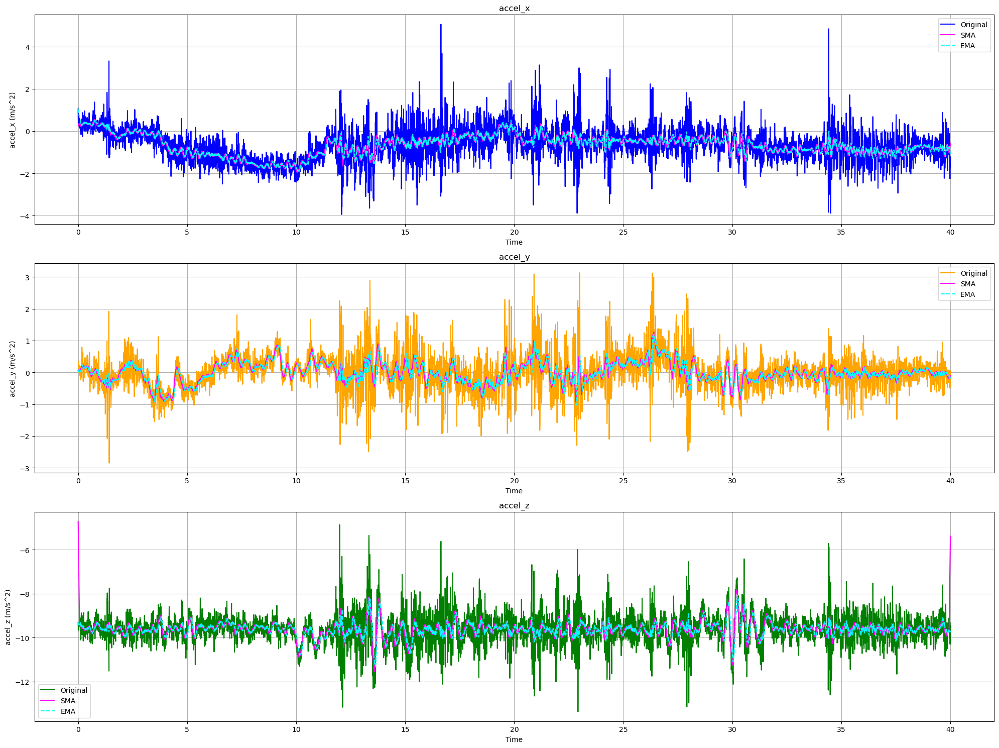

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value5')
data_t = np.load('t5')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [40]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set5 = []
set5_A = []
set5_B = []
x = 0


for data_point, time in combined_data :
    if time > 17 and time < 24:
        if data_point < -1or data_point > 1:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set5_A.append(morton)
            time_norm = time -17
            set5.append({'morton': morton, 'timestamp':time_norm})
            group_2A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set5_B.append(morton)
            time_norm = time -17
            set5.append({'morton': morton, 'timestamp':time_norm})
            group_2B.append(morton)

    
df_set5 = pd.DataFrame(set5, columns=['morton','timestamp'])
print(df_set5)


       morton  timestamp
0     1047746   0.001237
1     2446432   0.007626
2     1040064   0.014016
3     1047658   0.020406
4     1039466   0.026815
...       ...        ...
1090  1040064   6.970544
1091  1045600   6.976954
1092  1040106   6.983344
1093  1047616   6.989734
1094  1048290   6.996123

[1095 rows x 2 columns]


<>:13: SyntaxWarning: invalid decimal literal
<>:13: SyntaxWarning: invalid decimal literal
/tmp/ipykernel_16765/1698592525.py:13: SyntaxWarning: invalid decimal literal
  if data_point < -1or data_point > 1:


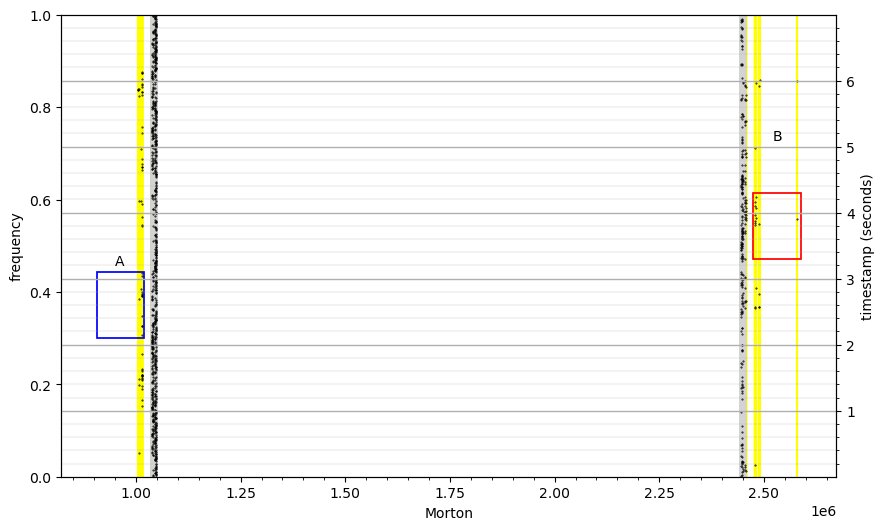

In [41]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set5_A, set5_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set5['morton']
timestamp_seconds = df_set5['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.4e6, 2.6e6)
#plt.xlim(1e6, 1.01e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.906*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
# Box A should start from 1.1
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.3), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')
# Box B should start from 3.3 2.780
plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

1 right and 1 lest change 

Improve: 2.5 sec long, improved the parameterization, however a lot of peaks hard to get th right one.

For chunk 1, set value_37_b0c9d2329ad1606b|2018-08-02--08-34-47

For chunk 1, set value_38_b0c9d2329ad1606b|2018-08-02--08-34-47

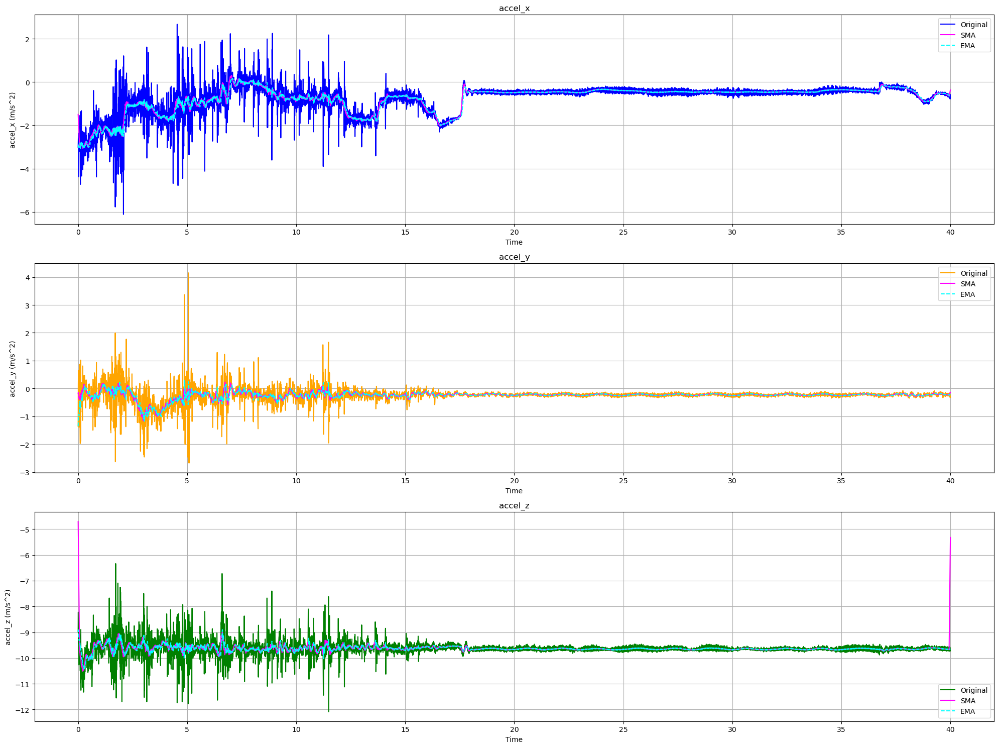

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_38_b0c9d2329ad1606b|2018-08-02--08-34-47')
data_t = np.load('t_38_b0c9d2329ad1606b|2018-08-02--08-34-47')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [43]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set38 = []
set38_A = []
set38_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -1.5 or data_point > 1.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set38_A.append(morton)
            time_norm = time
            set38.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set38_B.append(morton)
            time_norm = time
            set38.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set38 = pd.DataFrame(set38, columns=['morton','timestamp'])
print(df_set38)


       morton  timestamp
0     1048162   0.006411
1     2448578   0.012801
2     1048162   0.019191
3     1037514   0.025581
4     1037408   0.031992
...       ...        ...
1089  1048298   6.971618
1090  2446408   6.978008
1091  2447082   6.984419
1092  1047786   6.990809
1093  1047658   6.997199

[1094 rows x 2 columns]


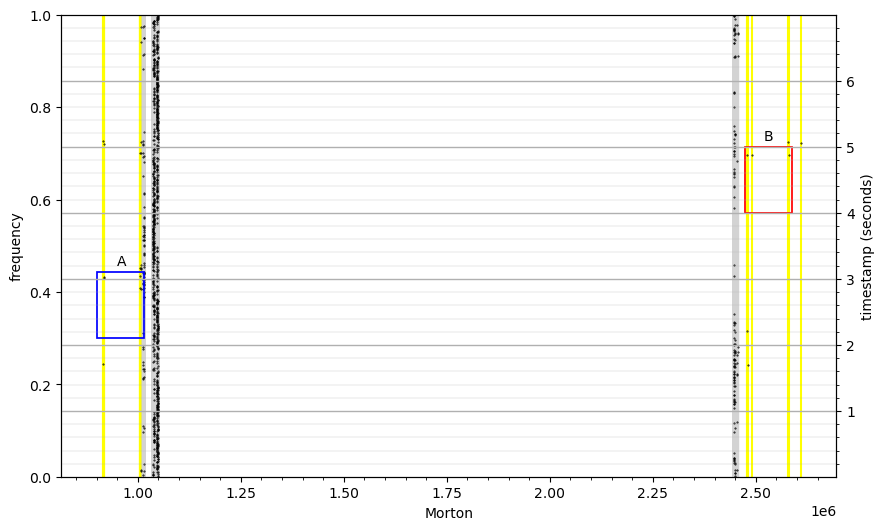

In [44]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set38_A, set38_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set38['morton']
timestamp_seconds = df_set38['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Not good example, the lane change is at the beginning from 0 - 3.5 but its unclear in the data

Improve: Couldn't improve because Elias fucked up its a right lane change

Chunk 1 for set t_31_b0c9d2329ad1606b|2018-08-06--10-04-53

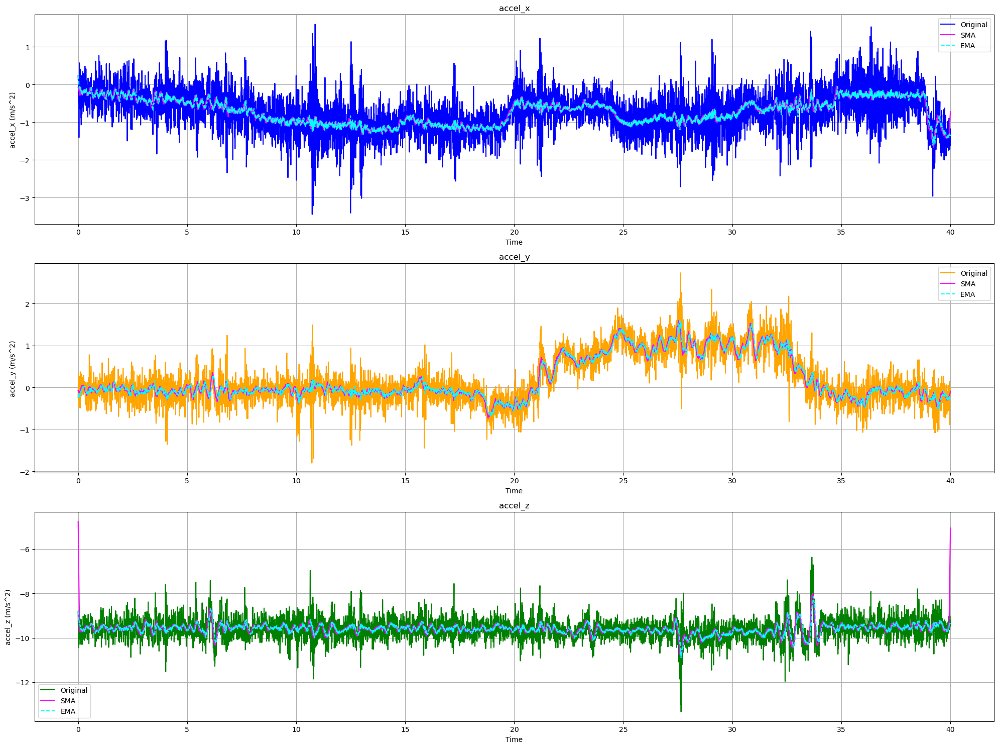

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_31_b0c9d2329ad1606b|2018-08-06--10-04-53')
data_t = np.load('t_31_b0c9d2329ad1606b|2018-08-06--10-04-53')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [46]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set31 = []
set31_A = []
set31_B = []
group_3A = []
group_3B = []
x = 0


for data_point, time in combined_data :
    if time > 16 and time < 23:
        if data_point < -0.5 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set31_A.append(morton)
            time_norm = time -16
            set31.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_3A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set31_B.append(morton)
            time_norm = time -16
            set31.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_3B.append(morton)

    
df_set31 = pd.DataFrame(set31, columns=['morton','timestamp'])
print(df_set31)


       morton  timestamp
0     1047784   0.002634
1     1047786   0.009023
2     1046250   0.015433
3     1046248   0.021822
4     1046122   0.028211
...       ...        ...
1090  2448962   6.974185
1091  1048290   6.980574
1092  2446570   6.986983
1093  2446952   6.993372
1094  2448480   6.999761

[1095 rows x 2 columns]


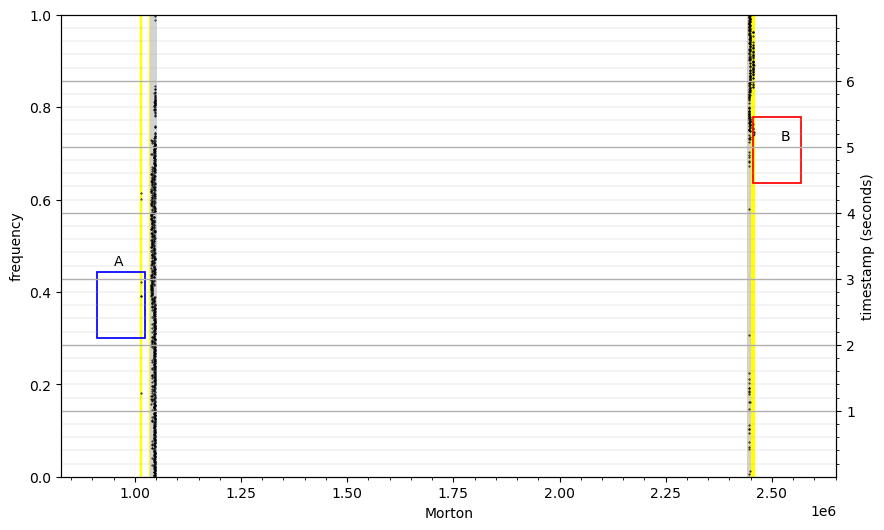

In [47]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set31_A, set31_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set31['morton']
timestamp_seconds = df_set31['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.4e6, 2.48e6)
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots


plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.455*1e6, 4.447), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

We have a good lane change here starting from arond 18 to 22. However our theory does not seem to capture them as the threshold it to high once again. But we need to make surte that we compensate in that case for the possibilty that we also capture more noise. Thus some constraints needs to be added to adjust for this. What exactly do we need to add? That remains uncertain. 

Chunk 1 for set t_34_b0c9d2329ad1606b|2018-08-06--10-04-53, does 3 right lane changes.

Chunk 1 for set value4

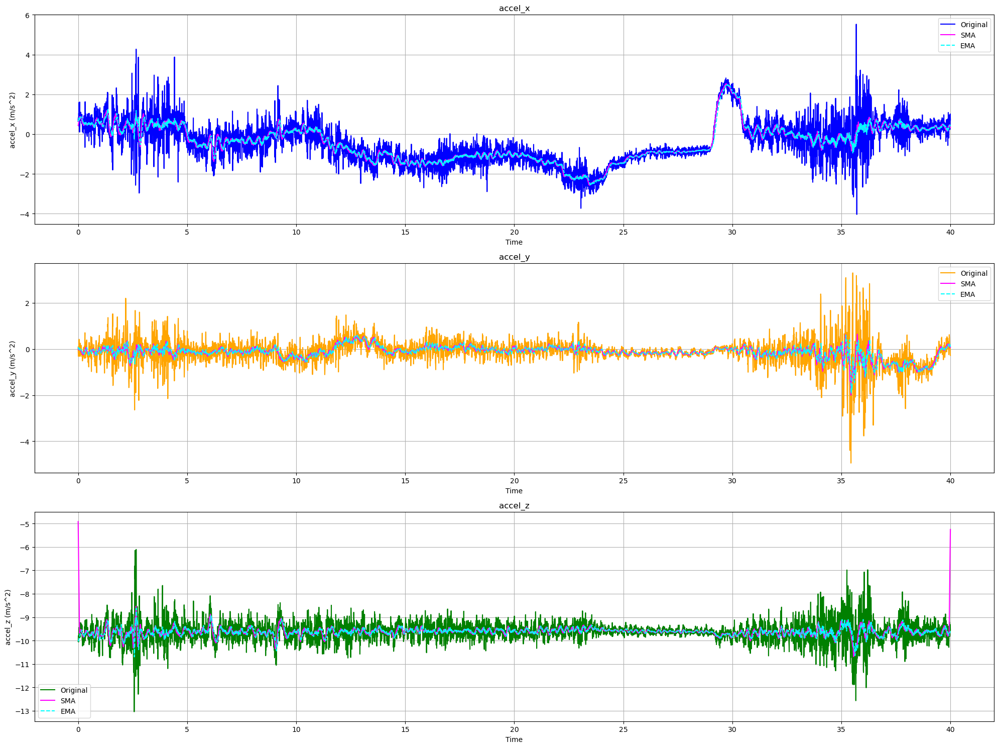

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value4')
data_t = np.load('t4')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [49]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set4 = []
set4_A = []
set4_B = []


x = 0


for data_point, time in combined_data :
    if time > 8 and time < 15:
        if data_point < -0.5 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set4_A.append(morton)
            time_norm = time - 8
            set4.append({'morton': morton, 'timestamp':time_norm})
            group_3A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set4_B.append(morton)
            time_norm = time - 8
            set4.append({'morton': morton, 'timestamp':time_norm})
            group_3B.append(morton)

    
df_set4 = pd.DataFrame(set4, columns=['morton','timestamp'])
print(df_set4)


       morton  timestamp
0     1048258   0.004754
1     1048168   0.011143
2     1045696   0.017533
3     1045576   0.023922
4     1039944   0.030311
...       ...        ...
1090  1046120   6.973907
1091  1047778   6.980317
1092  1046082   6.986707
1093  2446408   6.993096
1094  1047648   6.999485

[1095 rows x 2 columns]


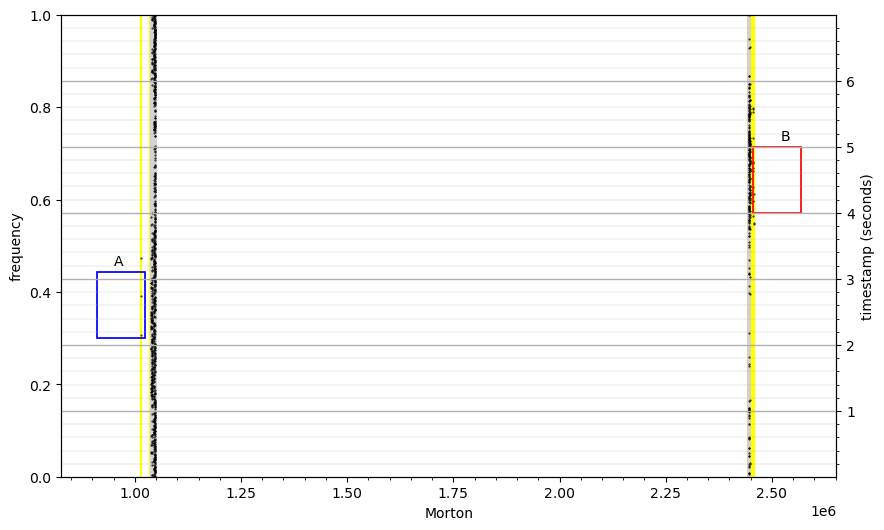

In [50]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set4_A, set4_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set4['morton']
timestamp_seconds = df_set4['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(1e6, 1.05e6)
#plt.xlim(2.44e6, 2.46e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.4550*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Once again we see that thethreshold is to high for the model to be able to detect the peaks for the left lane change. The lane change takes takes place between 9 - 12. 

Chunk 1 for set 37 b0c9d2329ad1606b|2018-08-14--10-32-01

Currently trying out different values for the threshold to see how we can adjust the results

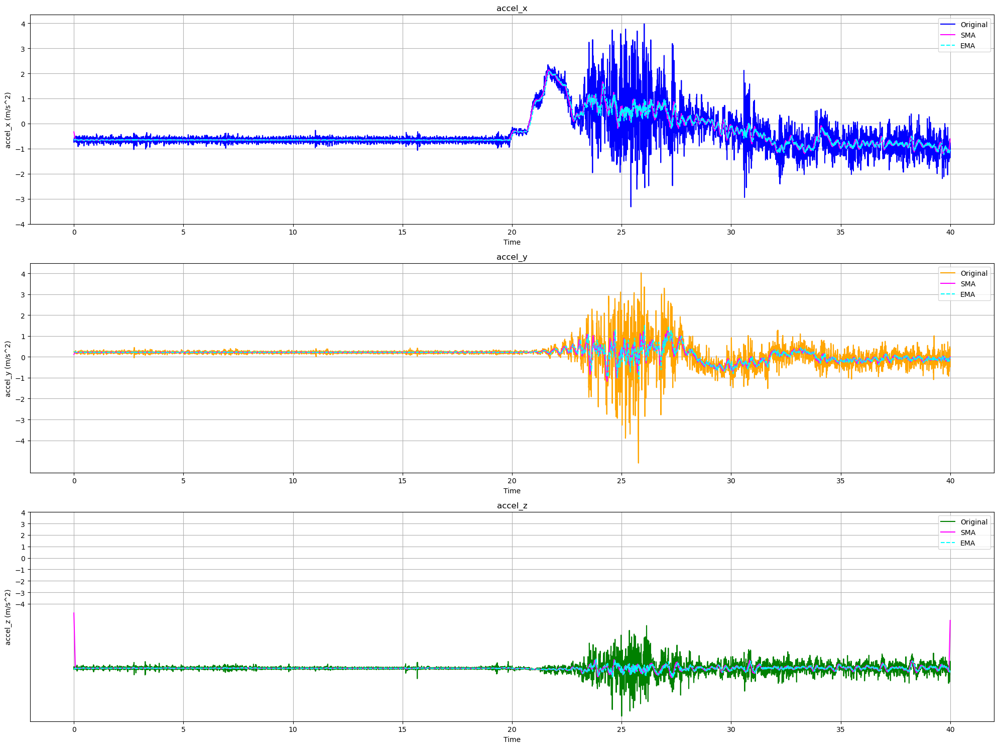

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_37_b0c9d2329ad1606b|2018-08-14--10-32-01')
data_t = np.load('t_37_b0c9d2329ad1606b|2018-08-14--10-32-01')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.yticks(np.arange(-4, 5, 1))
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [52]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set37 = []
set37_A = []
set37_B = []
time17 = []
counter = 0
x = 0



for data_point, time in combined_data :
    if time > 27.8 and time < 34.8:
        if data_point < -1 or data_point > 0.8:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set37_A.append(morton)
            time_norm = time - 27.8
            set37.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_4A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set37_B.append(morton)
            time_norm = time - 27.8
            set37.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_4B.append(morton)

    
df_set37 = pd.DataFrame(set37, columns=['morton','timestamp'])
print(df_set37)


       morton  timestamp
0     2446530   0.004995
1     2446434   0.011385
2     2448610   0.017794
3     2449122   0.024184
4     2448482   0.030573
...       ...        ...
1089  1048266   6.968987
1090  1045738   6.975377
1091  1040064   6.981786
1092  1039944   6.988176
1093  1046240   6.994565

[1094 rows x 2 columns]


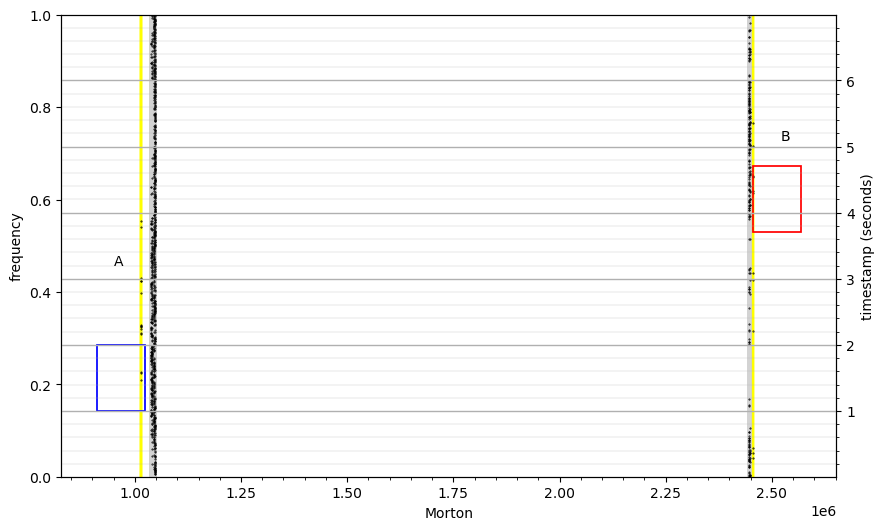

In [53]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set37_A, set37_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set37['morton']
timestamp_seconds = df_set37['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.4e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots


plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.455*1e6, 3.7), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

The left lane change take place between 29 - 32 however, the threshold is too high. Also its a bit hard to find the lane change as its pattern is not that that explicit in the graph.  3.7 sec long

Chunk 1 set 6 from b0c9d2329ad1606b|2018-08-16--21-52-30

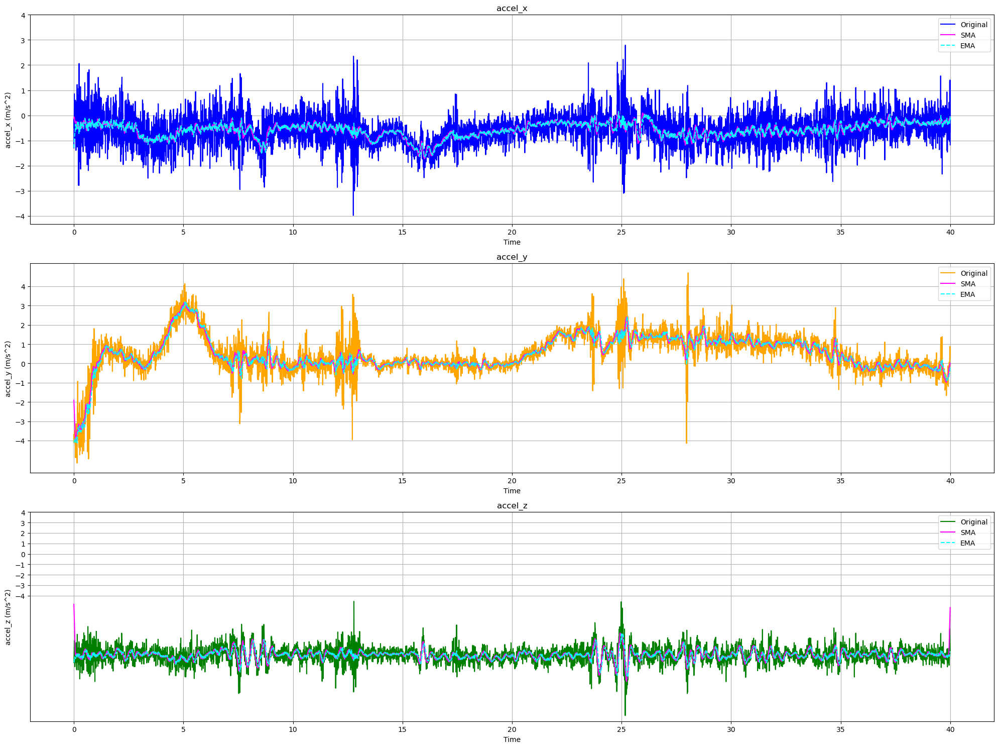

In [54]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_6_b0c9d2329ad1606b|2018-08-16--21-52-30')
data_t = np.load('t_6_b0c9d2329ad1606b|2018-08-16--21-52-30')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)
    plt.yticks(np.arange(-4, 5, 1))


plt.tight_layout()
plt.show()

In [55]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set6 = []
set6_A = []
set6_B = []
time18 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 8 and time < 15:
        if data_point < -0.5 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set6_A.append(morton)
            time_norm = time -8
            set6.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_3A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set6_B.append(morton)
            time_norm = time -8
            set6.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_3B.append(morton)

    
df_set6 = pd.DataFrame(set6, columns=['morton','timestamp'])
print(df_set6)


       morton  timestamp
0     1047616   0.005305
1     1046218   0.011694
2     2446560   0.018083
3     1040096   0.024492
4     1045568   0.030881
...       ...        ...
1089  1048168   6.968119
1090  1047776   6.974508
1091  1047656   6.980897
1092  1047778   6.987306
1093  1046088   6.993695

[1094 rows x 2 columns]


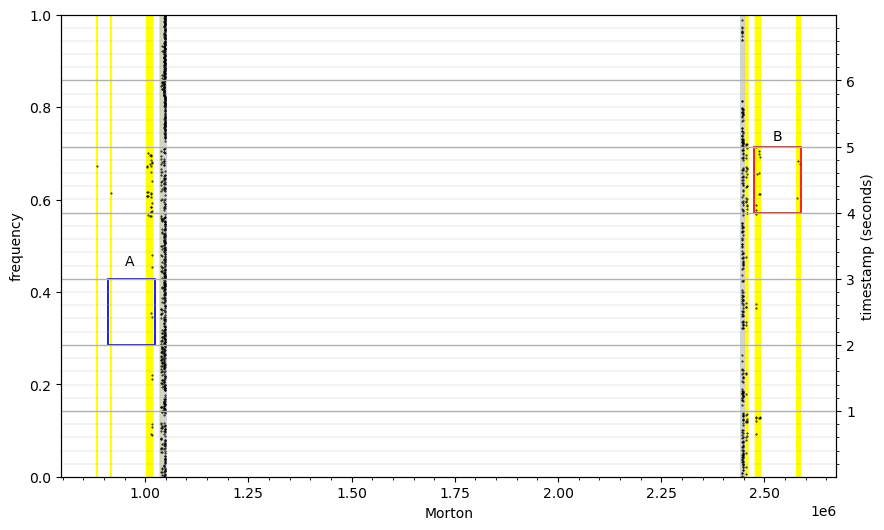

In [56]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set6_A, set6_B]
data_colors = ['yellow', 'lightgray']

morton18 = df_set6['morton']
timestamp_seconds = df_set6['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton18, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton18, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 2), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Here we can see that we are capturing the peaks that pass the threshold, however the time in which the lane change occurs is between 10.5 - 13 seconds. The peaks show up at aroudn 13 we guess. We are in a way capturing some of the interesting timestamps in box A but not B. How would we know what are FP and what are TP

Improve: We adjusted the parameter to -1

Chunk 1 set 8 from b0c9d2329ad1606b|2018-08-16--21-52-30

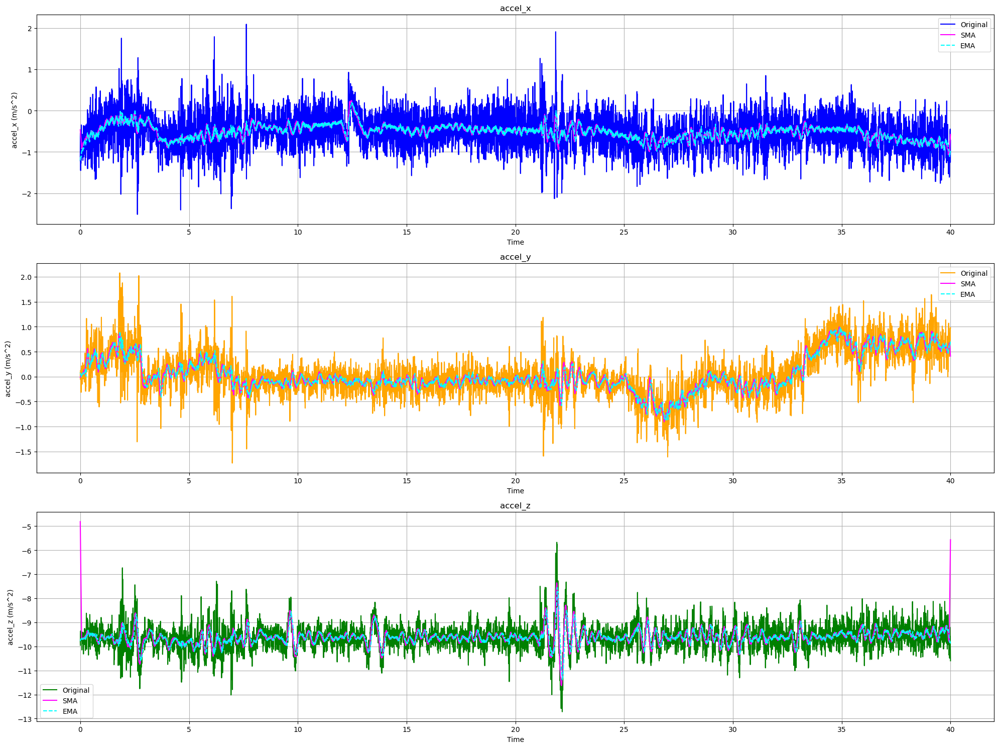

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_8_b0c9d2329ad1606b|2018-08-16--21-52-30')
data_t = np.load('t_8_b0c9d2329ad1606b|2018-08-16--21-52-30')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [58]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set8_1 = []
set8_A1 = []
set8_B1 = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 0 and time < 7:
        if data_point < -0.5 or data_point > 1.7:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_A1.append(morton)
            time_norm = time 
            set8_1.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set8_B1.append(morton)
            time_norm = time 
            set8_1.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set8_1 = pd.DataFrame(set8_1, columns=['morton','timestamp'])
print(df_set8_1)


       morton  timestamp
0     1047648   0.006389
1     1047624   0.012778
2     1048160   0.019167
3     1047648   0.025576
4     1046210   0.031965
...       ...        ...
1089  1040104   6.969523
1090  2479296   6.975952
1091  2448576   6.982341
1092  1007304   6.988730
1093  1012930   6.995119

[1094 rows x 2 columns]


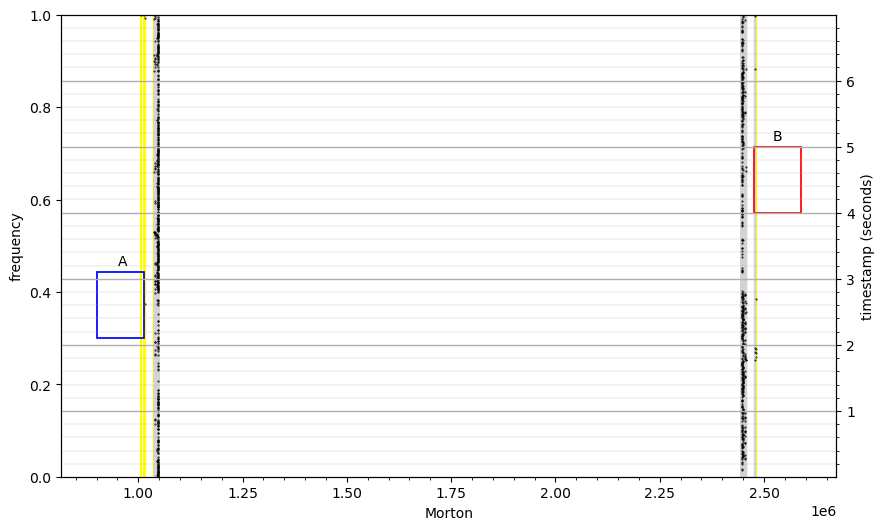

In [59]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set8_A1, set8_B1]
data_colors = ['yellow', 'lightgray']

morton17 = df_set8_1['morton']
timestamp_seconds = df_set8_1['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

The lane change takes place from 0 - 4.4 seconds. Dont really know what to say about this as it does seem to capture something. The lane change does not really look like a left lane change. 

Chunk 1 set 12 from b0c9d2329ad1606b|2018-08-17--14-17-47

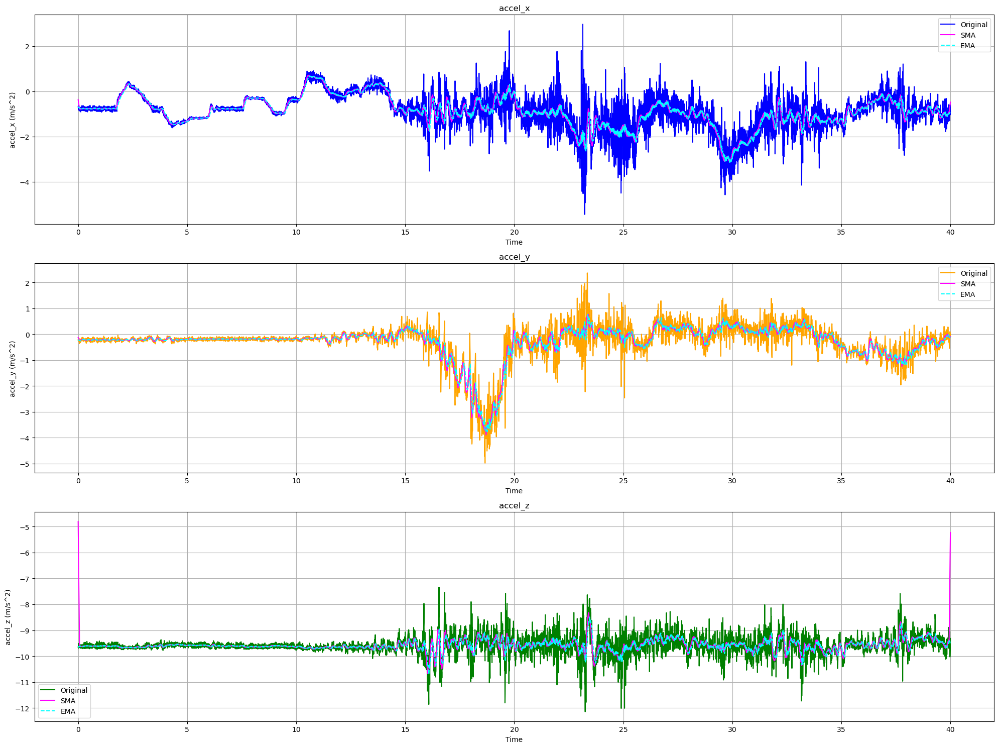

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_12_b0c9d2329ad1606b|2018-08-17--14-17-47')
data_t = np.load('t_12_b0c9d2329ad1606b|2018-08-17--14-17-47')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [61]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set12 = []
set12_A = []
set12_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 19 and time < 26:
        if data_point < -0.5 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set12_A.append(morton)
            time_norm = time - 19
            set12.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_3A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set12_B.append(morton)
            time_norm = time - 19
            set12.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_3B.append(morton)

    
df_set12 = pd.DataFrame(set12, columns=['morton','timestamp'])
print(df_set12)


       morton  timestamp
0      915176   0.005400
1      906472   0.011790
2      908514   0.018181
3      915178   0.024592
4      916714   0.030982
...       ...        ...
1089  1045698   6.971621
1090  1039554   6.978032
1091  1039426   6.984422
1092  1038056   6.990813
1093  1040106   6.997223

[1094 rows x 2 columns]


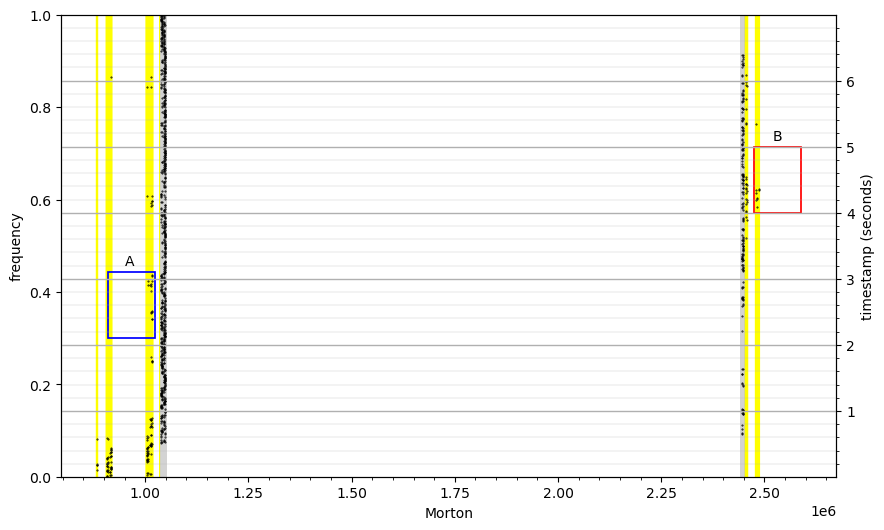

In [62]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set12_A, set12_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set12['morton']
timestamp_seconds = df_set12['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.91*1e6, 2.1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Improve: No need to improve, the original parameters seems to capture the lane change 

Chink 1 set 2 from b0c9d2329ad1606b|2018-08-17--14-55-39
It is a bad lane chage. He was standing still in traffic and it was slow. 

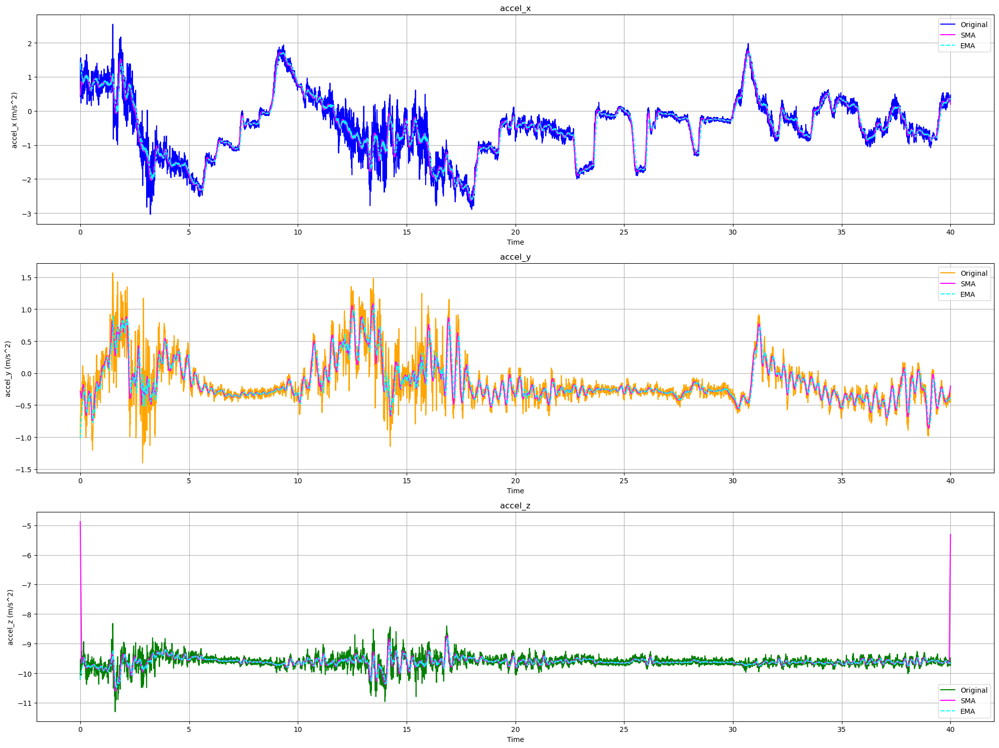

In [63]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_2_b0c9d2329ad1606b|2018-08-17--14-55-39')
data_t = np.load('t_2_b0c9d2329ad1606b|2018-08-17--14-55-39')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [64]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set2_1 = []
set2_A1 = []
set2_B1 = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 28 and time < 35:
        if data_point < -0.4 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_A1.append(morton)
            time_norm = time -28
            set2_1.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set2_B1.append(morton)
            time_norm = time -28
            set2_1.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)

    
df_set2_1 = pd.DataFrame(set2_1, columns=['morton','timestamp'])
print(df_set2_1)


       morton  timestamp
0     1045730   0.003240
1     1045704   0.009628
2     1045706   0.016036
3     1045608   0.022424
4     1045602   0.028812
...       ...        ...
1090  1039456   6.973627
1091  1039426   6.980015
1092  1039562   6.986403
1093  1039592   6.992811
1094  1040064   6.999199

[1095 rows x 2 columns]


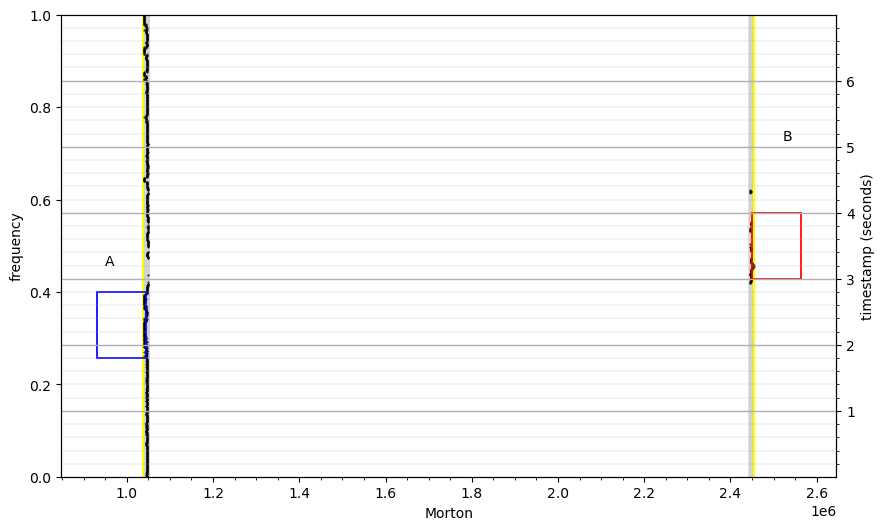

In [65]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set2_A1, set2_B1]
data_colors = ['yellow', 'lightgray']

morton17 = df_set2_1['morton']
timestamp_seconds = df_set2_1['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.478e6, 2.48e6)
#plt.xlim(1e6, 1.05e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.93*1e6, 1.8), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.45*1e6, 3), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Chunk 1 set 35 from b0c9d2329ad1606b|2018-08-17--12-07-08

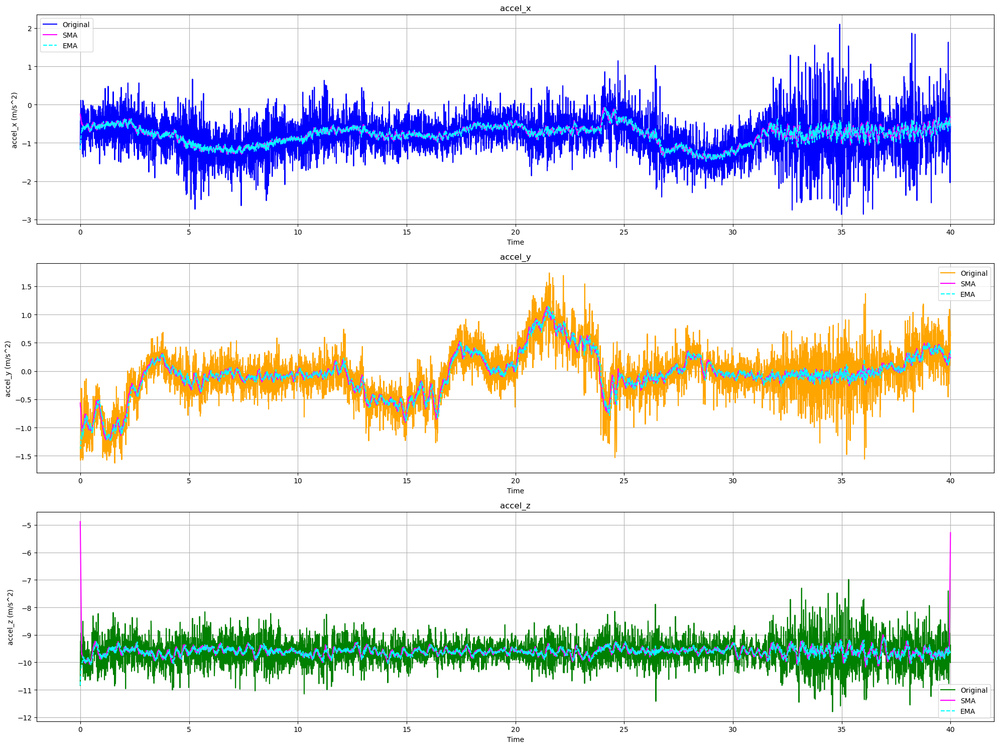

In [66]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for EMA calculation

# Function to read the binary file containing acceleration data
# Assuming you have these files, otherwise this code won't run as is
data_value = np.load('value_35_b0c9d2329ad1606b|2018-08-17--12-07-08')
data_t = np.load('t_35_b0c9d2329ad1606b|2018-08-17--12-07-08')

# Assuming data_t is a 1D array of timestamps
# Find the minimum and maximum timestamps
min_time = np.min(data_t)
max_time = np.max(data_t)

# Calculate the range of time
time_range = max_time - min_time

# Normalize the time data to be between 0 and 40 seconds
data_t_normalized = ((data_t - min_time) / time_range) * 40
data_t_list = data_t_normalized.tolist()

df_time =  pd.DataFrame(data_t_list, columns=['timestamp'])


# Extracting individual components of acceleration
accel_x = data_value[:, 0]
accel_y = data_value[:, 1]
accel_z = data_value[:, 2]


# Simple Moving Average Function
def simple_moving_average(data, window_size):
    window = np.ones(int(window_size))/float(window_size)
    return np.convolve(data, window, 'same')

# Exponential Moving Average Function
def exponential_moving_average(data, window_size):
    return pd.Series(data).ewm(span=window_size, adjust=False).mean().to_numpy()


# Applying SMA and EMA
window_size = 20  # Example window size
sma_accel_x = simple_moving_average(accel_x, window_size)
ema_accel_x = exponential_moving_average(accel_x, window_size)
 
sma_accel_y = simple_moving_average(accel_y, window_size)
ema_accel_y = exponential_moving_average(accel_y, window_size)
 
sma_accel_z = simple_moving_average(accel_z, window_size)
ema_accel_z = exponential_moving_average(accel_z, window_size)

 
# Plotting the acceleration data with SMA and EMA
plt.figure(figsize=(20, 15))


titles = ['accel_x', 'accel_y', 'accel_z']
colors = ['blue', 'orange', 'green']
data_sets = [(accel_x, sma_accel_x, ema_accel_x),
             (accel_y, sma_accel_y, ema_accel_y),
             (accel_z, sma_accel_z, ema_accel_z)]


for i, (data, sma_data, ema_data) in enumerate(data_sets):
    plt.subplot(3, 1, i+1)
    plt.plot(data_t_normalized, data, label='Original', color=colors[i])
    plt.plot(data_t_normalized, sma_data, label='SMA', color='magenta')
    plt.plot(data_t_normalized, ema_data, label='EMA', color='cyan', linestyle='--')
    plt.xlabel('Time')
    plt.ylabel(f'{titles[i]} (m/s^2)')
    plt.title(titles[i])
    plt.legend()
    plt.grid(True)


plt.tight_layout()
plt.show()

In [67]:
# Combine the data in a list
combined_data = list(zip( accel_y, data_t_normalized))

series2_data = data_value[:, 1]
set35 = []
set35_A = []
set35_B = []
time17 = []
counter = 0
x = 0


for data_point, time in combined_data :
    if time > 23 and time < 30:
        if data_point < -0.5 or data_point > 0.5:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set35_A.append(morton)
            time_norm = time - 23
            set35.append({'morton': morton, 'timestamp':time_norm})
            group_A.append(morton)
            group_3A.append(morton)
        else:
            morton = calculateMortonFromXYAccelerationFloats(x, data_point)
            set35_B.append(morton)
            time_norm = time - 23
            set35.append({'morton': morton, 'timestamp':time_norm})
            group_B.append(morton)
            group_3B.append(morton)

    
df_set35 = pd.DataFrame(set35, columns=['morton','timestamp'])
print(df_set35)


       morton  timestamp
0     2448480   0.005025
1     2449000   0.011454
2     2448578   0.017843
3     2449090   0.024231
4     2449002   0.030620
...       ...        ...
1090  1045728   6.974318
1091  1047616   6.980707
1092  1046248   6.987095
1093  1046082   6.993483
1094  1046088   6.999872

[1095 rows x 2 columns]


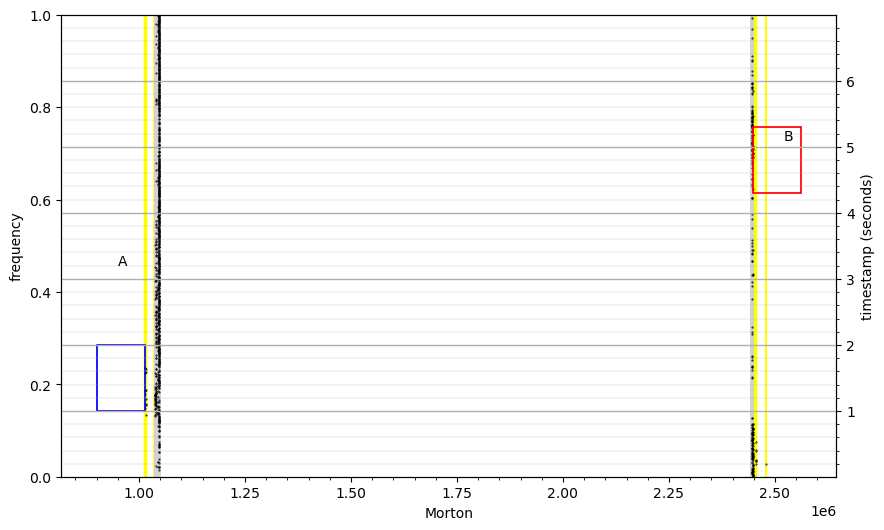

In [68]:
import numpy as np
import matplotlib.pyplot as plt

data1 = [set35_A, set35_B]
data_colors = ['yellow', 'lightgray']

morton17 = df_set35['morton']
timestamp_seconds = df_set35['timestamp']



plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.xlabel('Morton')
plt.ylabel('frequency')
plt.ylim((0, 1))

#Plot the occurrences as vertical lines instead of horizontal
#plt.vlines(morton17, 0, 1, colors='lightgrey', linestyles='solid',linewidth = 4)
plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])
#Create a second y-axis for the timestamps
ax2 = plt.twinx()
ax2.set_ylabel('timestamp (seconds)')
#Set the limit for the timestamp y-axis to align with the data
ax2.set_ylim([min(timestamp_seconds), max(timestamp_seconds)])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()
#plt.ylim(33, 40) #Zoomed in where we think the lane change is happening 
#plt.xlim(2.4e6, 2.6e6)
#plt.xlim(1e6, 1.25e6)
#Plot the timestamps on this new y-axis, aligned with the occurrences on the left y-axis
ax2.scatter(morton17, timestamp_seconds, color='black', s=0.2)  # Adjust size of dots

plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 1), 1.14e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
#Area of interest is between 1-2
upper = plt.Rectangle( (2.448*1e6, 4.3), 1.14e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')
#Starts at 4 until 6 main area of interest is at 5 
plt.gca().add_patch(lower)
plt.gca().add_patch(upper)


plt.show()

Stacked up all the lane changes together. We werent able to find a common ground for the boxes because there was too much spread among the timestamps.

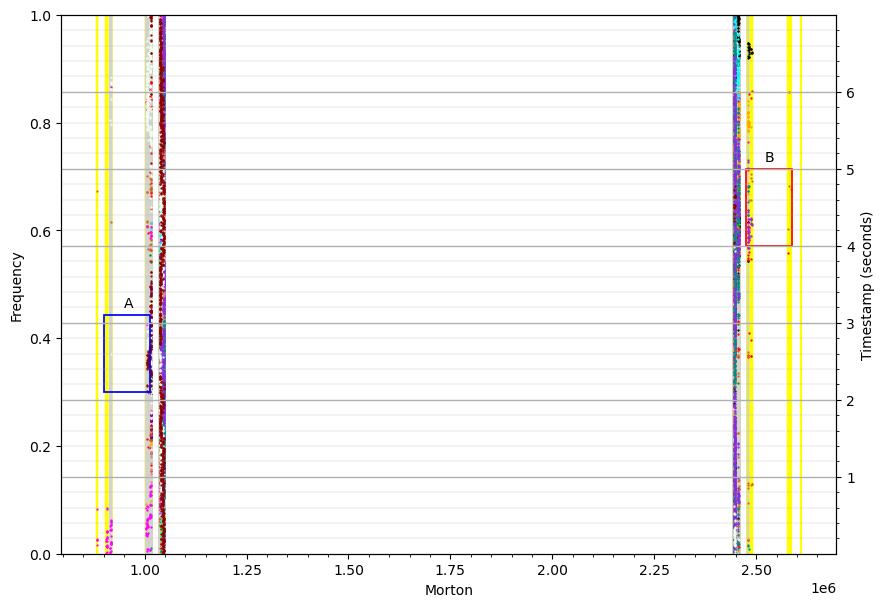

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_A, group_B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set42, df_set5, df_set21, df_set47, df_set37, df_set47, df_set6, df_set4, df_set12,df_set31, df_set35, df_set10, df_set17, df_set13_1, df_set7]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
# plt.xlim(1e6, 1.02e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'orange', 'blue','green','purple','chocolate','lime','magenta','cyan','lightcoral','darkcyan','blueviolet','honeydew', 'darkred']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.13e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.13e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

Stacked up the lane change which had a duration of around 2.5 sec, more prominent pattern

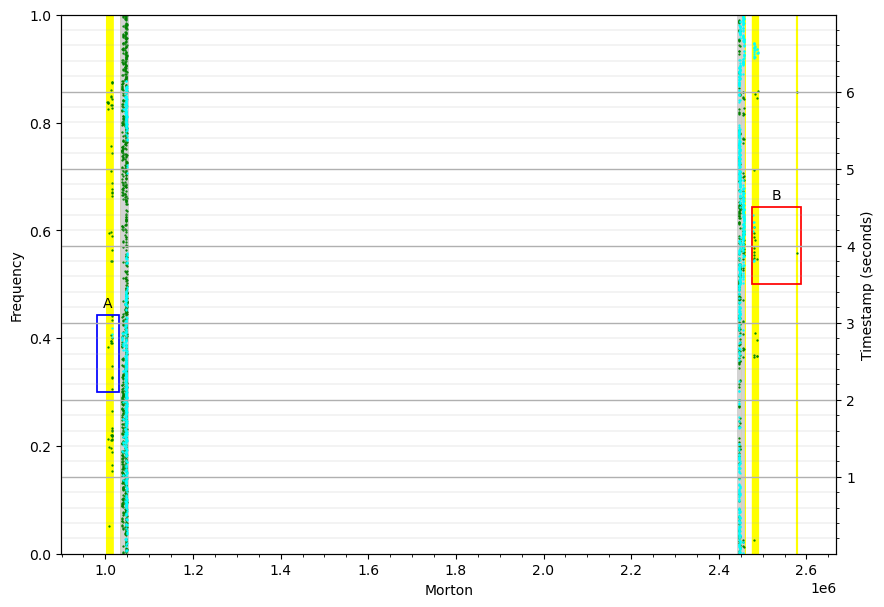

In [70]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
dataCol = [group_2A, group_2B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set5, df_set42]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(dataCol, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
# plt.xlim(1e6, 1.05e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['green', 'cyan']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)


# Draw boxes 
plt.text(0.995*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.98*1e6, 2.1), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 4.6, 'B')
upper = plt.Rectangle( (2.475*1e6, 3.5), 1.13e5, 1, linewidth=1.25, edgecolor="red", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

##### 4 seconds long snipets stacked up one each other

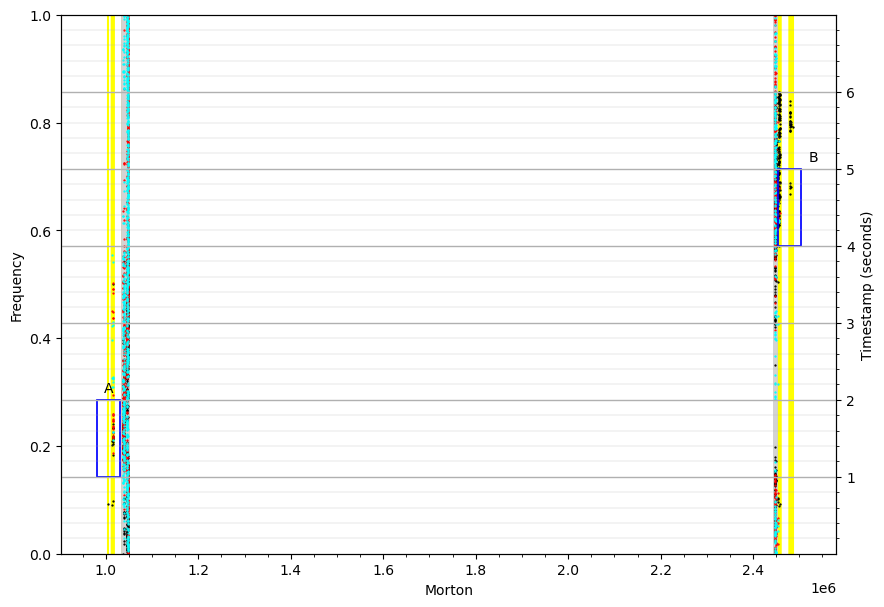

In [71]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_4A, group_4B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set21, df_set47, df_set37]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
#plt.xlim(1e6, 1.02e6)
#plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'cyan']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(0.995*1e6, 2.1, 'A')
lower = plt.Rectangle( (0.98*1e6, 1), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.454*1e6, 4), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

Zoomed in into Box B, to better see the spread of the timestamp

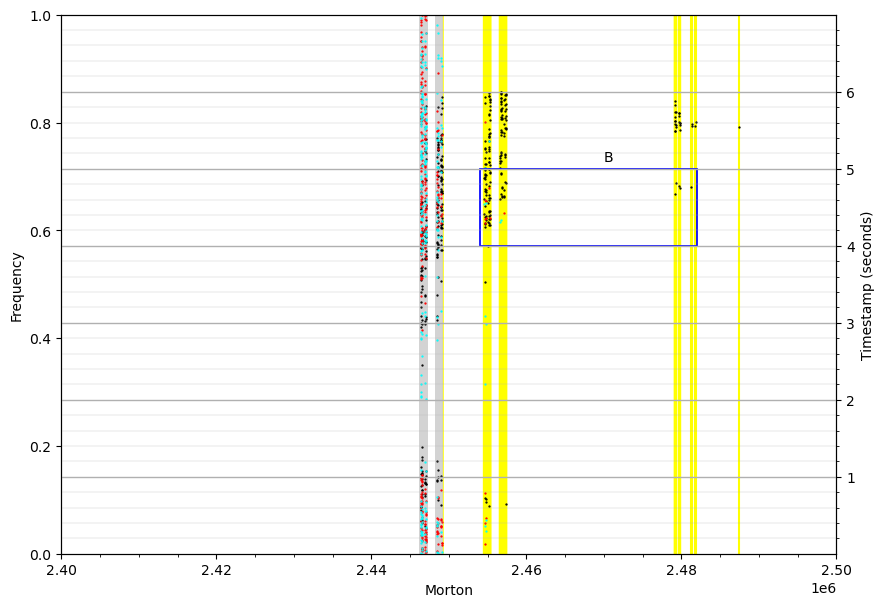

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_4A, group_4B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set21, df_set47, df_set37]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
#plt.xlim(1e6, 1.02e6)
plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'cyan']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)
"""
# Draw boxes 
plt.text(0.995*1e6, 2.1, 'A')
lower = plt.Rectangle( (0.98*1e6, 1), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.text(2.47*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.454*1e6, 4), 0.28e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

#plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

Zoomed in into Box A, to better see the spread of the timestamp

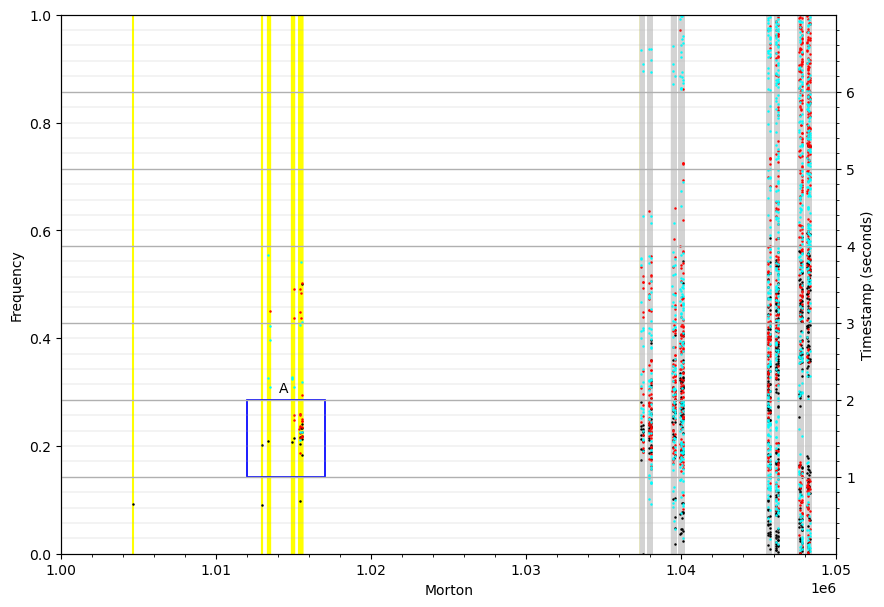

In [73]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_4A, group_4B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set21, df_set47, df_set37]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
plt.xlim(1e6, 1.05e6)
#plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'cyan']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.6)

# Draw boxes 
plt.text(1.014*1e6, 2.1, 'A')
lower = plt.Rectangle( (1.012*1e6, 1), 0.05e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.text(2.47*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.454*1e6, 4), 0.28e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.gca().add_patch(lower)
#plt.gca().add_patch(upper)

plt.show()

##### 3 seconds long snipets

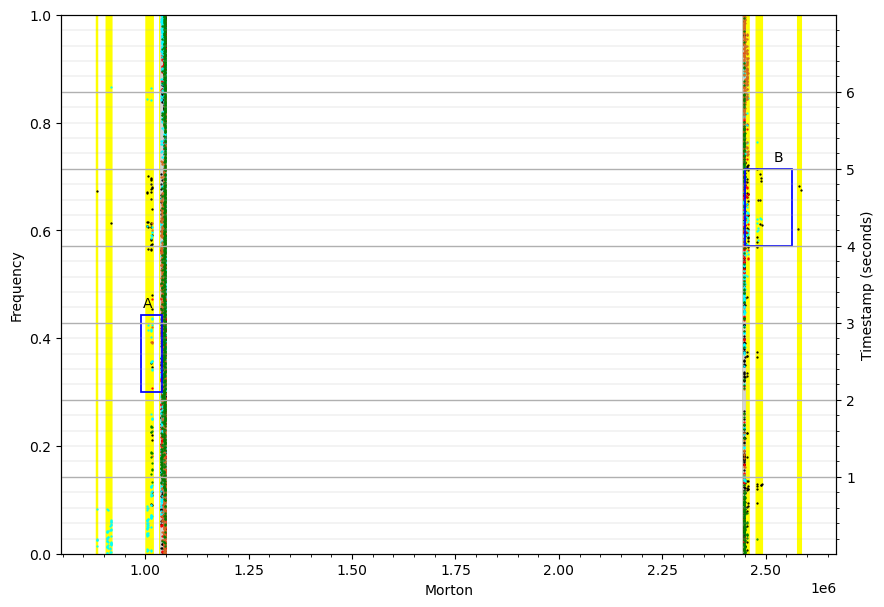

In [74]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_3A, group_3B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set6, df_set4, df_set12, df_set31,df_set35]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
#plt.xlim(1e6, 1.02e6)
#plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red', 'cyan','chocolate','green']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(0.995*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.99*1e6, 2.1), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.45*1e6, 4), 1.13e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

Zoomed into Box A

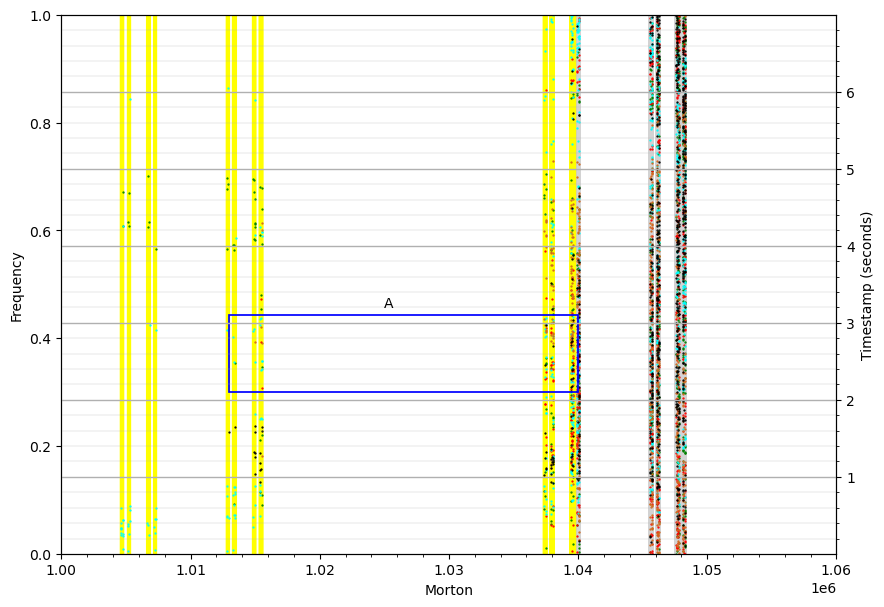

In [76]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_3A, group_3B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set6, df_set4, df_set12, df_set31,df_set35]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
plt.xlim(1e6, 1.06e6)
#plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['green', 'red', 'cyan','chocolate','black']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(1.025*1e6, 3.2, 'A')
lower = plt.Rectangle( (1.013*1e6, 2.1), 0.27e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.text(2.52*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.475*1e6, 4), 1.13e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.gca().add_patch(lower)
#plt.gca().add_patch(upper)

plt.show()

In [77]:
Zoomed into Box B

SyntaxError: invalid syntax (4227168022.py, line 1)

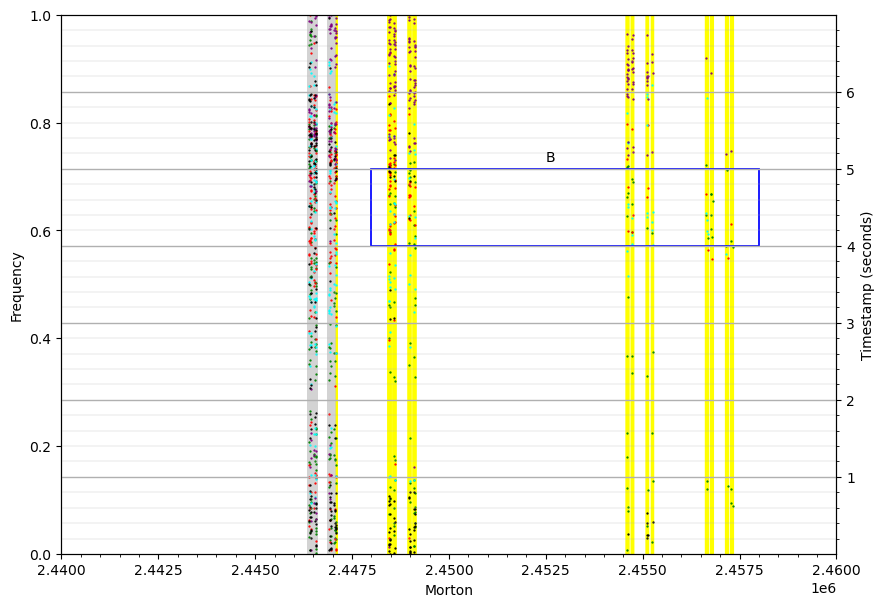

In [78]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_3A, group_3B]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set6, df_set4, df_set12, df_set31,df_set35]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
#plt.xlim(1e6, 1.06e6)
plt.xlim(2.44e6, 2.46e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['green', 'red', 'cyan','purple','black']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)
"""
# Draw boxes 
plt.text(0.995*1e6, 3.2, 'A')
lower = plt.Rectangle( (1.013*1e6, 2.1), 0.27e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.text(2.4525*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.448*1e6, 4), 0.1e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

#plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

##### Stacked up lane changes when the road was curving to the left

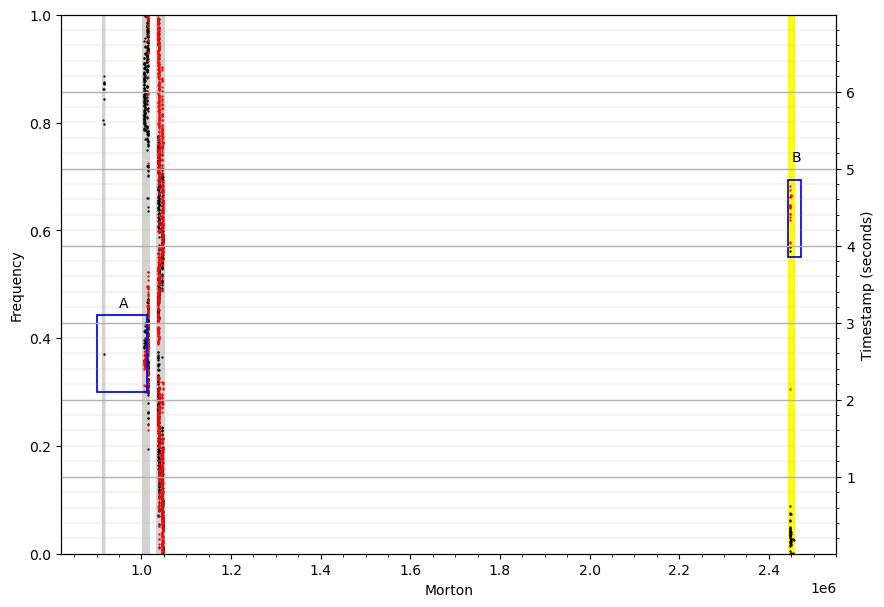

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_LA, group_LB]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set13_1, df_set7]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
#plt.xlim(1e6, 1.02e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(0.95*1e6, 3.2, 'A')
lower = plt.Rectangle( (0.9*1e6, 2.1), 1.13e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
plt.text(2.45*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.442*1e6, 3.85), 0.3e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

##### Stacked up lane changes when the road was curving to the right

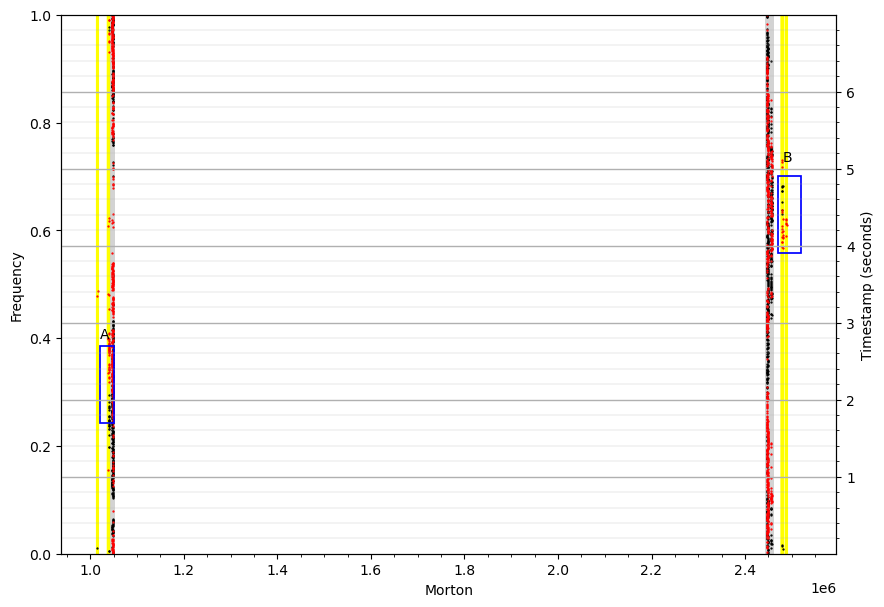

In [80]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_RA, group_RB]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set10, df_set17]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
# plt.xlim(1e6, 1.1e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(1.02*1e6, 2.8, 'A')
lower = plt.Rectangle( (1.02e6, 1.7), 0.3e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

plt.text(2.48*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.47*1e6, 3.9), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')

plt.gca().add_patch(lower)
plt.gca().add_patch(upper)

plt.show()

Zoomed into Box A

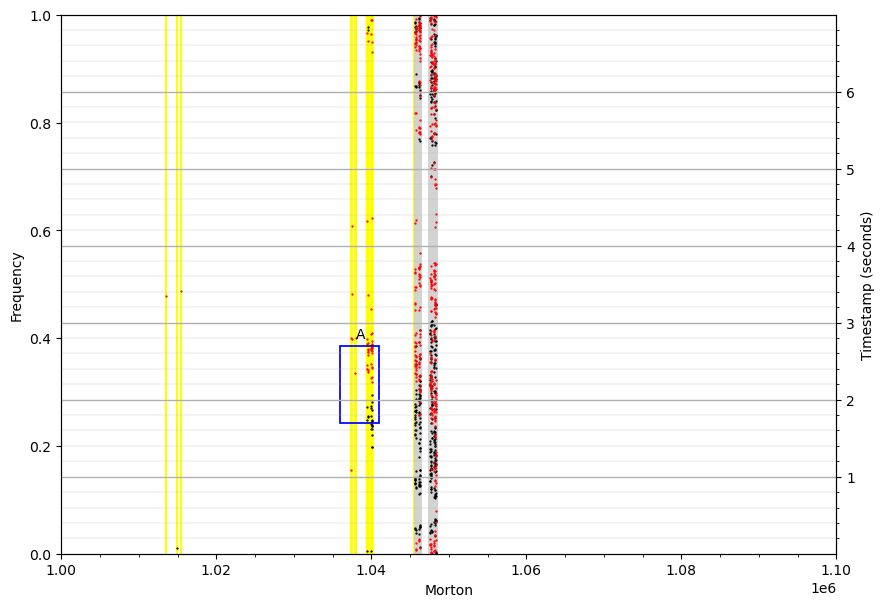

In [81]:
import numpy as np
import matplotlib.pyplot as plt

# Highlighting the data we are interested in
data1 = [group_RA, group_RB]
data_colors = ['yellow', 'lightgray']

# Assuming df_seg1, df_seg2, df_seg3, df_seg4, df_lane_change_morton are predefined DataFrames
# Assuming times_for_maneuver_lc is predefined

# Extract data from segments
data_segments = [df_set10, df_set17]
data = []
timestamp_seconds = []
for df in data_segments:
    data.append(df['morton'])
    timestamp = df['timestamp']
    timestamp_seconds.append(timestamp)

# Calculate global timestamp limits
min_timestamp = min(min(ts) for ts in timestamp_seconds)
max_timestamp = max(max(ts) for ts in timestamp_seconds)

# Plotting
plt.figure(figsize=(10, 7))

plt.eventplot(data1, orientation='horizontal', colors=data_colors, lineoffsets=[0.5, 0.5])

plt.xlabel('Morton')
plt.ylabel('Frequency')
plt.ylim((0, 1))
plt.xlim(1e6, 1.1e6)
# plt.xlim(2.4e6, 2.5e6)

# Create a second y-axis for timestamps
ax2 = plt.twinx()
ax2.set_ylabel('Timestamp (seconds)')
ax2.set_ylim([min_timestamp, max_timestamp])
ax2.grid(which = "major", linewidth = 1)
ax2.grid(which = "minor", linewidth = 0.2)
ax2.minorticks_on()


# Plot timestamps as scatter points
colors = ['black', 'red']
for ds, color, ts in zip(data, colors, timestamp_seconds):
    ax2.scatter(ds, ts, color=color, s=0.4)

# Draw boxes 
plt.text(1.038*1e6, 2.8, 'A')
lower = plt.Rectangle( (1.036*1e6, 1.7), 0.05e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.text(2.48*1e6, 5.1, 'B')
upper = plt.Rectangle( (2.47*1e6, 3.9), 0.5e5, 1, linewidth=1.25, edgecolor="blue", facecolor='none')
"""
plt.gca().add_patch(lower)
# plt.gca().add_patch(upper)

plt.show()